<a href="https://colab.research.google.com/github/DeSmith14/ComputationalImaging/blob/master/Homework_1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Slanted Edge MTF Measurement

## DeErick Smith
## University of Arizona
## Spring 2023

This section of the notebook uses slanted edge images to analyze the MTF for an iPhone 13 Pro Max smart phone. The listed camera specifications are as follows:

12 MP, f/1.5, 26mm (wide), 1/2k, 1.5µm, ISO 32, Dual Pixel AF, Sensor Shift OIS
12 MP, f/1.8, 13mm, PDAF
12 MP, f/2.8, OIS

In [42]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats
from scipy.optimize import curve_fit
from scipy.special import erf
from google.colab import files
#%matplotlib inline
plt.rcParams['figure.figsize'] = [20, 20]
plt.rcParams.update({'font.size': 22})


In [41]:
!pip install rawpy
import rawpy

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 21.6 MB/s eta 0:00:00


## Wide Lens

We consider below a photo taken from 20 centimeters away. 

iPhone 13 Pro Max
ƒ/1.5
1/2123
26mm
ISO32 

In [38]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [43]:
raw = rawpy.imread('/content/drive/MyDrive/Graduate School/OPTI 600C/IMG_7490.DNG')
rawImage=raw.raw_image_visible

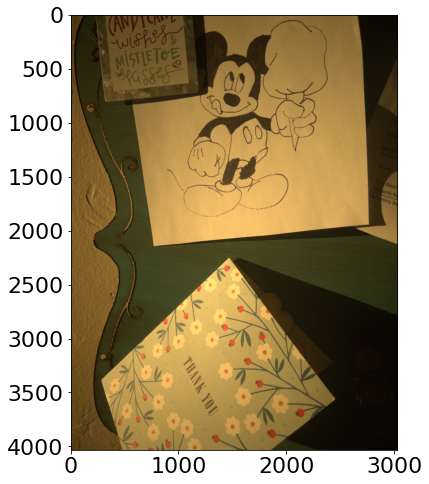

In [384]:
plt.imshow(raw.postprocess())

In [385]:
rawImage.shape

(3024, 4032)

(-0.5, 99.5, 49.5, -0.5)

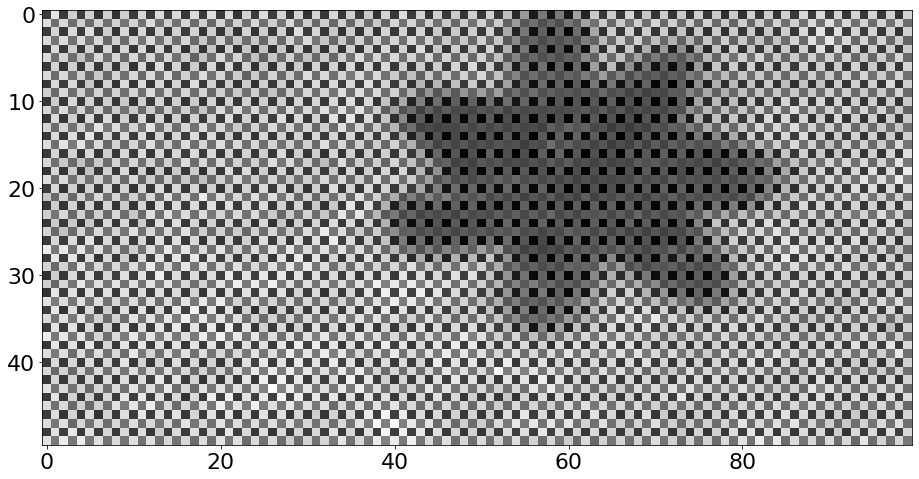

In [393]:
plt.imshow(rawImage[1700:1750,2950:3050],cmap='gray')
plt.axis('image')
#plt.savefig('Turtle.pdf')
#files.download('samsungTele.pdf')

we break the image into its RGB components with the following code. The green images should look the same, look for red and blue features in the original image to identify the corresponding channels. 

In [416]:
b=rawImage[0:4032:2,0:3024:2]
r=rawImage[1:4032:2,1:3024:2]
g1=rawImage[1:4032:2,0:3024:2]
g2=rawImage[0:4032:2,1:3024:2]

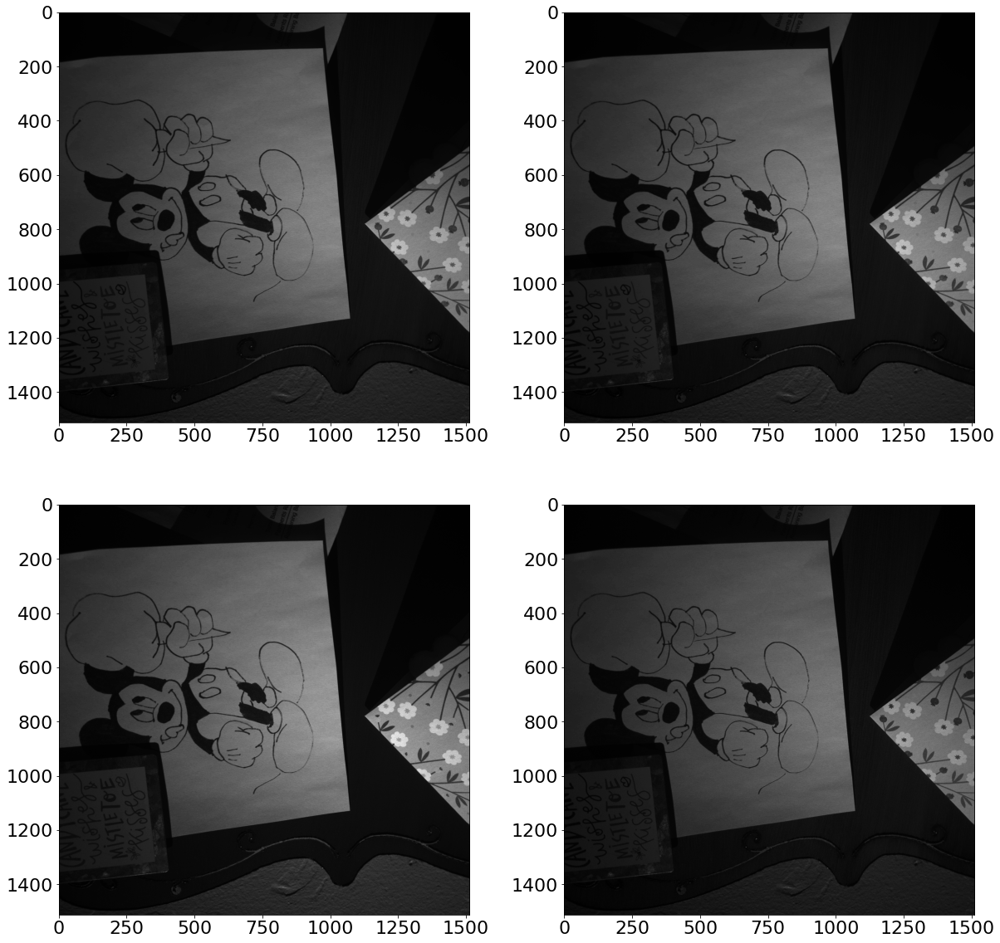

In [417]:
plt.figure(figsize=(20,20))
plt.subplot(2,2,1)
plt.imshow(g1,cmap="gray")
plt.subplot(2,2,2)
plt.imshow(g2,cmap="gray")
plt.subplot(2,2,3)
plt.imshow(r,cmap="gray")
plt.subplot(2,2,4)
plt.imshow(b,cmap="gray")
plt.savefig('samsungTeleRGGB.pdf')
#files.download('samsungTeleRGGB.pdf')

In [39]:
g1.dtype

dtype('uint16')

In [40]:
print(np.max(b), np.min(b))

3980 578


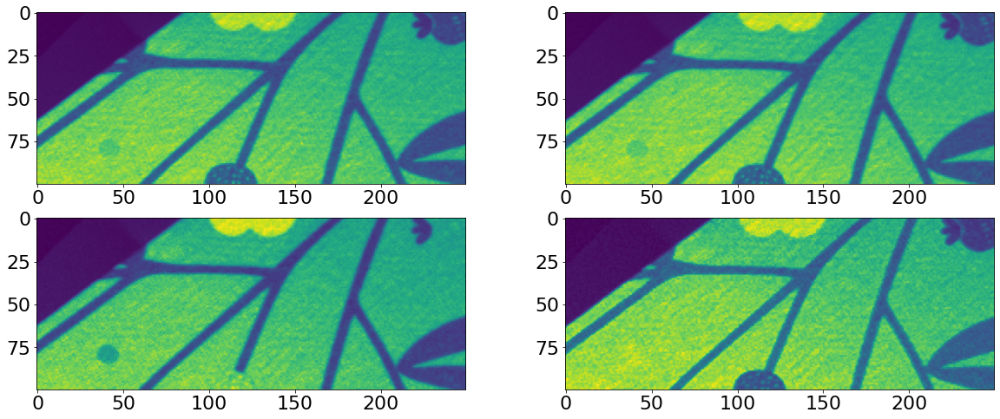

In [418]:
plt.subplot(2,2,1)
plt.imshow(g1[625:725,1250:1500])
plt.subplot(2,2,2)
plt.imshow(g2[625:725,1250:1500])
plt.subplot(2,2,3)
plt.imshow(r[625:725,1250:1500])
plt.subplot(2,2,4)
plt.imshow(b[625:725,1250:1500])

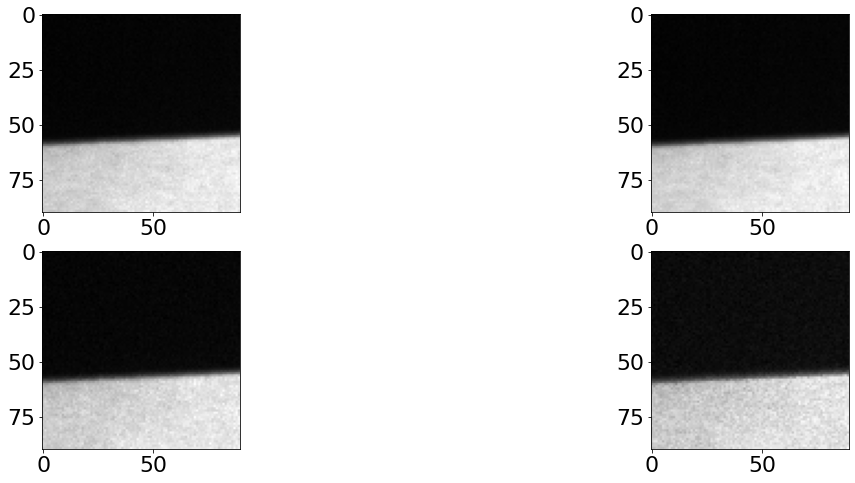

In [479]:
plt.rcParams['figure.figsize'] = [20, 8]
g1c=g1[100:190,300:390]
g2c=g2[100:190,300:390]
rc=r[100:190,300:390]
bc=b[100:190,300:390]
plt.subplot(2,2,1)
plt.imshow(g1c,cmap='gray')
plt.subplot(2,2,2)
plt.imshow(g2c,cmap='gray')
plt.subplot(2,2,3)
plt.imshow(rc,cmap='gray')
plt.subplot(2,2,4)
plt.imshow(bc, cmap='gray')
plt.savefig('samsungTeleEdge.pdf')
#files.download('samsungTeleEdge.pdf')

To find the relative displacement of the edge between rows we need to find the slope of the edge, which we do here.

mean slope = -0.09130551096843231


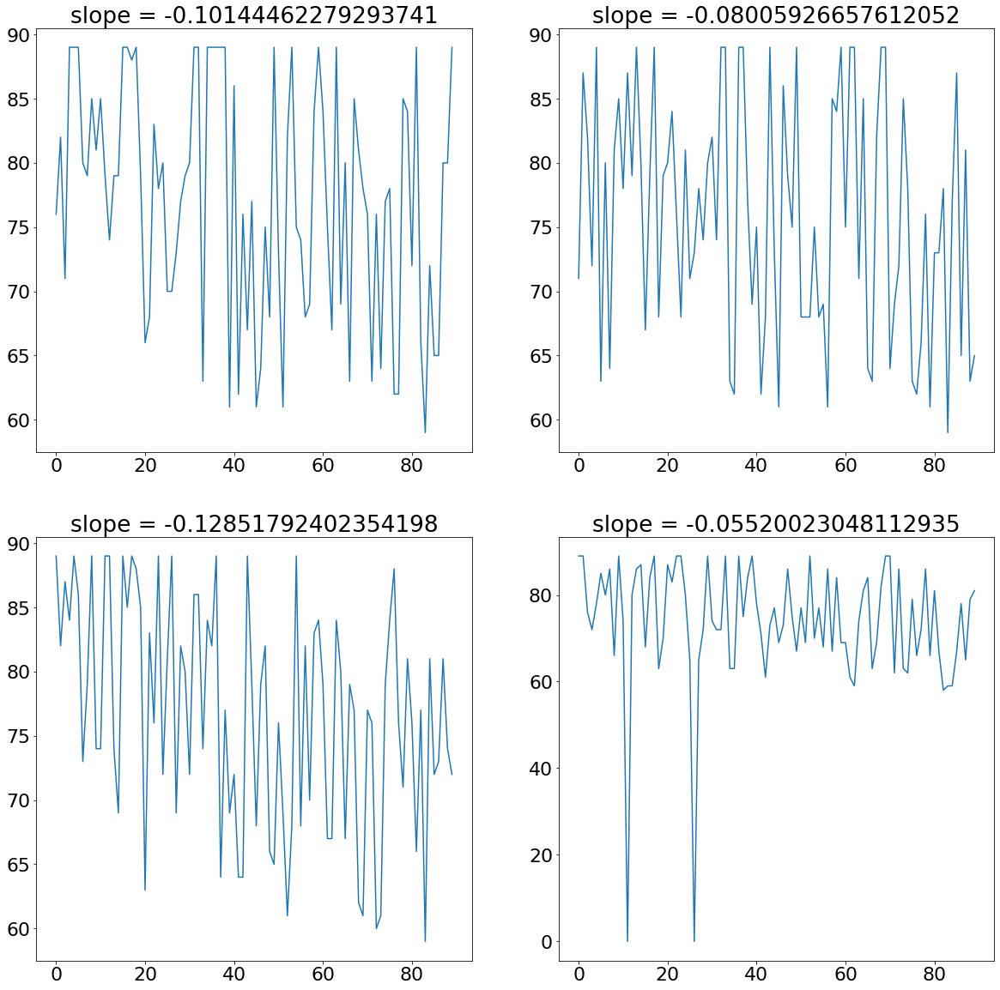

In [480]:
plt.figure(figsize=(20,20))
plt.subplot(2,2,1)
y=np.argmin(np.gradient(g1c, axis=0),axis=0)
reg=stats.linregress(np.arange(len(y)),y)
plt.plot(y)
plt.title('slope = '+str(reg.slope))
slope=reg.slope
plt.subplot(2,2,2)
y=np.argmin(np.gradient(g2c, axis=0),axis=0)
reg=stats.linregress(np.arange(len(y)),y)
plt.plot(y)
plt.title('slope = '+str(reg.slope))
slope=reg.slope+slope
plt.subplot(2,2,3)
y=np.argmin(np.gradient(rc, axis=0),axis=0)
reg=stats.linregress(np.arange(len(y)),y)
plt.plot(y)
plt.title('slope = '+str(reg.slope))
slope=reg.slope+slope
plt.subplot(2,2,4)
y=np.argmin(np.gradient(bc, axis=0),axis=0)
reg=stats.linregress(np.arange(len(y)),y)
plt.plot(y)
plt.title('slope = '+str(reg.slope))
slope=reg.slope+slope
slope=slope/4
print('mean slope =', slope)

If we plot data along a single column we only have a couple of data points within the edge region. 

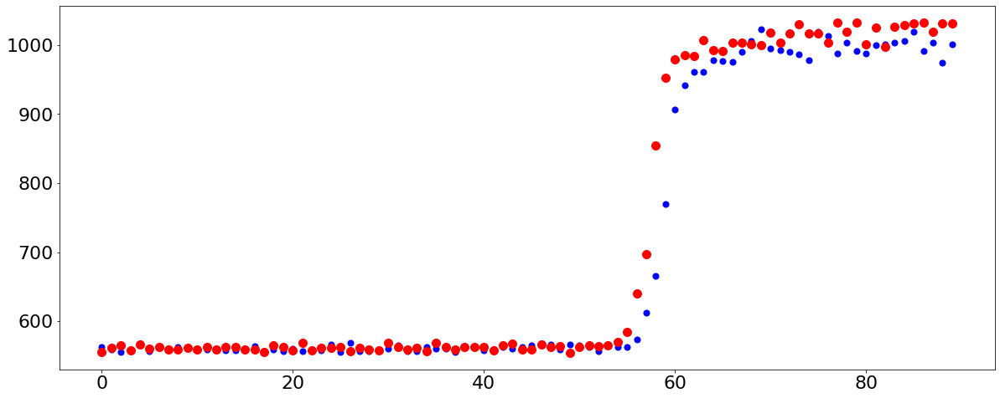

In [484]:
plt.scatter(np.arange(90),g1c[:,0], s=50, c='blue')
plt.scatter( np.arange(90),g1c[:,29], s=100,c='red')

In [483]:
#np.arange(20)
np.size(g1c[:,0])
#np.size(g1c[:,29])

90

shifting the edge points according to the slope of the edge and combining data from multiple columns, we can densely sample the edge region. The function describing the edge is the edge shape function.

In [486]:
points=np.zeros((np.size(g2c),2))
for pop in np.arange(g2c.shape[0]):
  for pip in np.arange(g2c.shape[1]):
    points[pop*g2c.shape[1]+pip,:]=(pop-slope*pip,g2c[pop,pip])
points=points[points[:,0].argsort(),:]


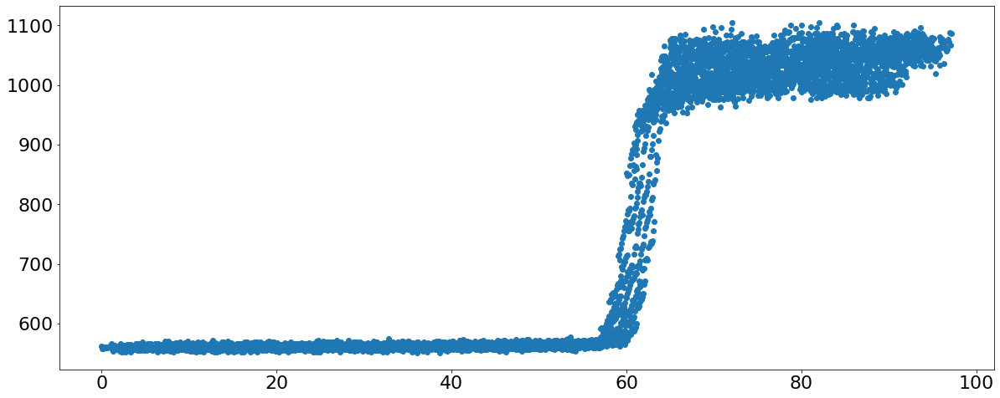

In [487]:
plt.scatter(points[:,0],points[:,1])

We choose to model the edge as an erf function and find the best fit parameters to the erf. 

In [488]:
def erfunc(x, A, c, sig, off):
    return A*erf((x-c)/sig)+off

A , c, sig, off = -100., 6., 2., 150.


params, extras = curve_fit(erfunc, points[:,0],points[:,1],
                                    p0=[A, c, sig, off])

Text(0.5, 0, 'pixels')

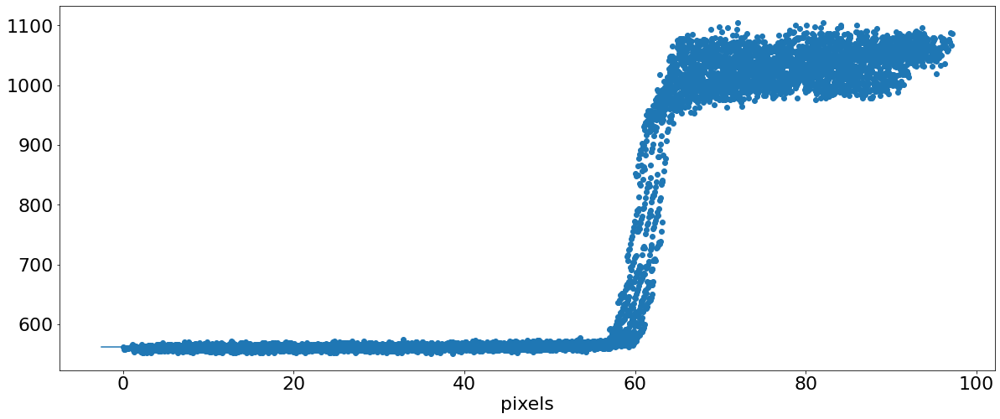

In [489]:
xx=np.linspace(-2.5,15,128)
plt.plot(xx, erfunc(xx, *params))
plt.scatter(points[:,0],points[:,1])
plt.xlabel('pixels')

The ERF function has the form
$$
{\rm erf}(x)=\frac{2}{\sqrt{\pi}}\int_0^x e^{-y^2}dy
$$
such that 
$$
\frac{d}{dx}{\rm erf}(x)=\frac{2}{\sqrt{\pi}}e^{-x^2}
$$

In our parameter fit of the edge, we are not concerned with the position or height, we are only concerned with the width, $\sigma$, which defines the width of the transition. Here our **line shape function**, e.g. the derivative of the edge shape function, accounting for the fact that the pixel spacing for each color channel is 3.8 microns, looks like this

Text(0.5, 0, 'microns')

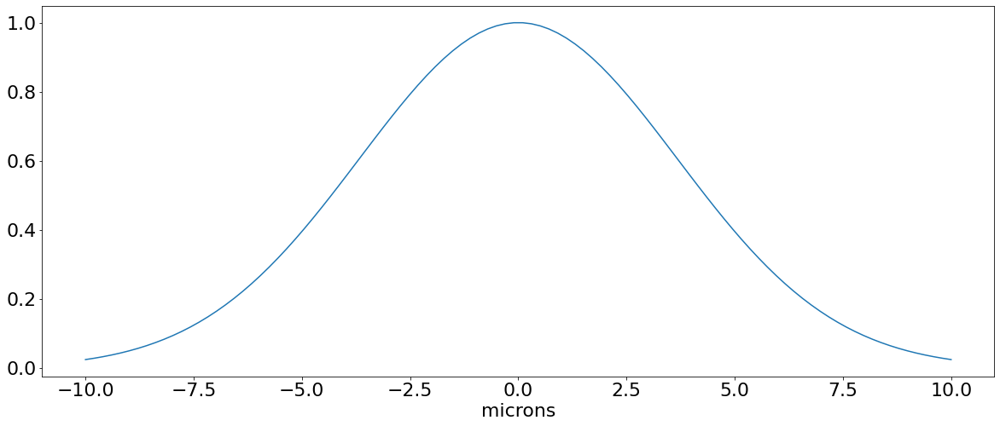

In [490]:
x=np.linspace(-10,10,100)
plt.plot(x, np.exp(-(x/(1.9*params[2]))**2))
plt.xlabel('microns')

In [491]:
params

array([235.98982478,  61.50466584,   2.73128046, 798.0908909 ])

In [492]:
var=params[2]

In [493]:
var

2.731280460542084

Text(0, 0.5, 'mtf')

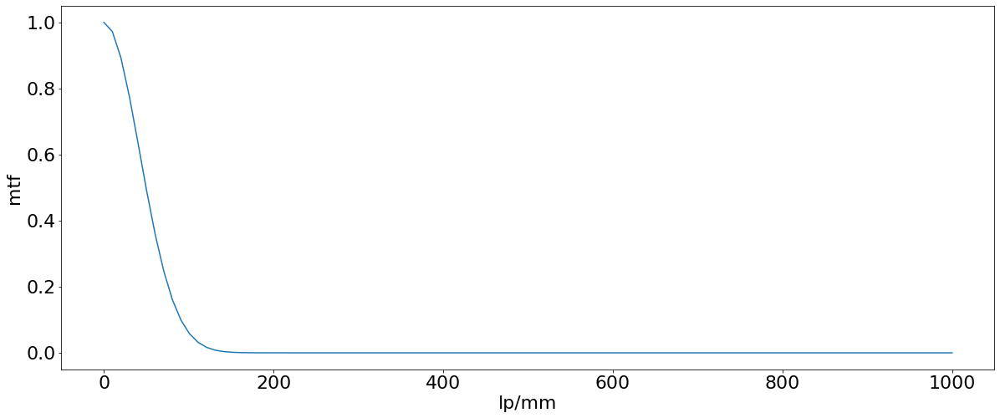

In [494]:
plt.plot(1000*np.linspace(0,1,100), np.exp(-(np.pi**2)*(3.8*var**2)*np.linspace(0,1,100)**2))
plt.xlabel("lp/mm")
plt.ylabel('mtf')

In [203]:
sfrData=np.array([[0,1],[50.25,0.892],[100.5,.657],[150,.425],[201,.304],[251,.253],[301,.188],[351,.067],[402,.037]])

Text(0, 0.5, 'mtf')

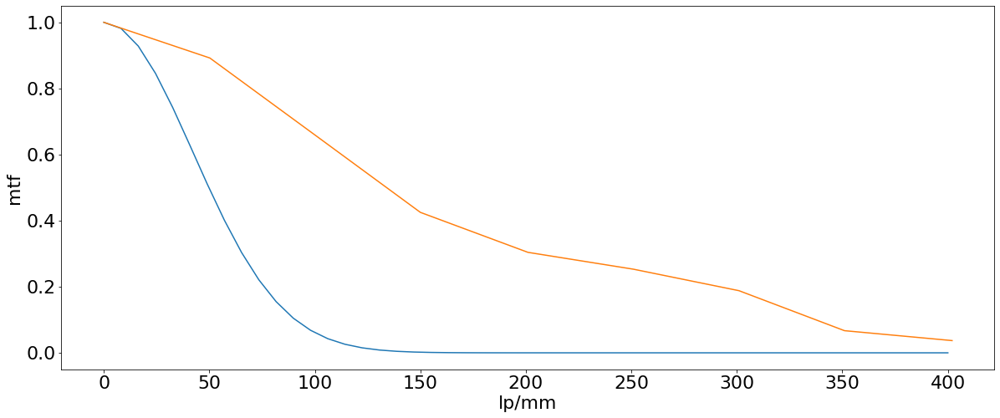

In [496]:
plt.plot(1000*np.linspace(0,.4,50), np.exp(-((np.pi))**2*(3.8*var**2)*np.linspace(0,.4,50)**2))
plt.plot(sfrData[:,0],sfrData[:,1])
plt.xlabel("lp/mm")
plt.ylabel('mtf')


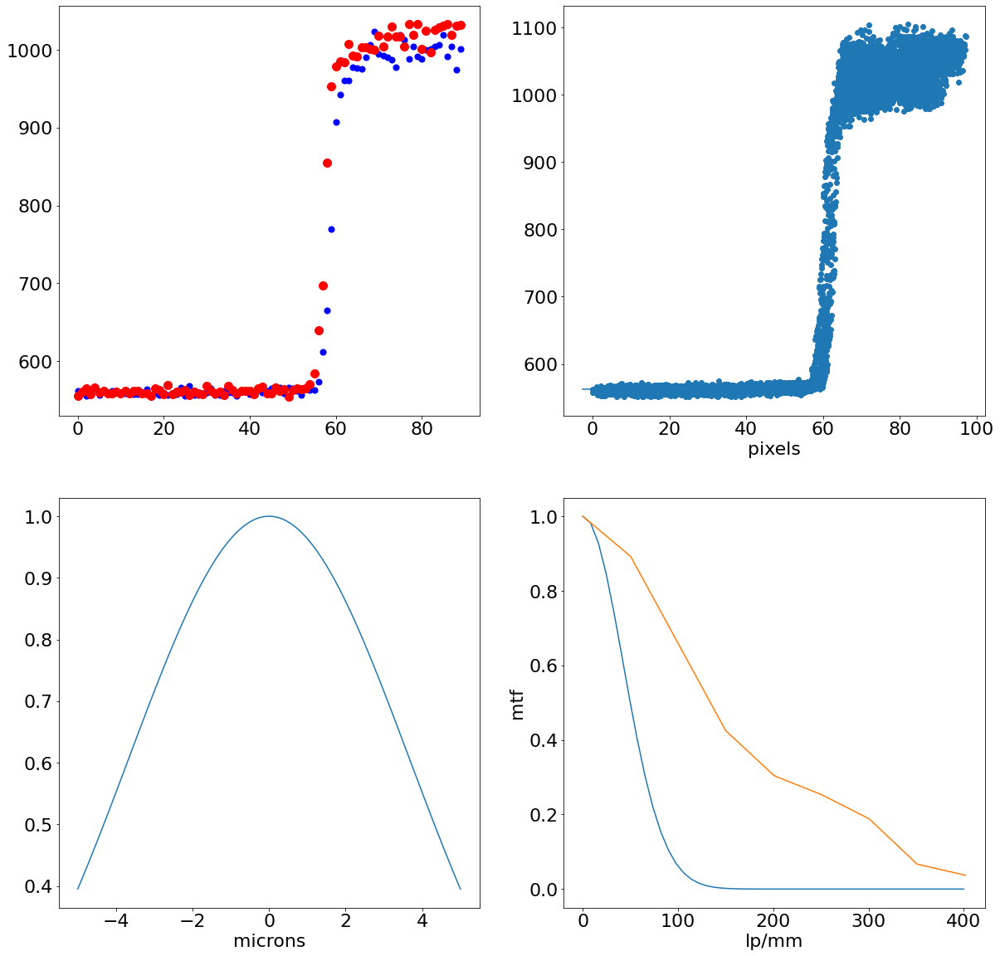

In [498]:
plt.figure(figsize=(20,20))
plt.subplot(2,2,1)
plt.scatter(np.arange(90),g1c[:,0], s=50, c='blue')
plt.scatter(np.arange(90),g1c[:,29], s=100,c='red')
plt.subplot(2,2,2)
plt.plot(xx, erfunc(xx, *params))
plt.scatter(points[:,0],points[:,1])
plt.xlabel('pixels')
plt.subplot(2,2,3)
x=np.linspace(-5,5,100)
plt.plot(x, np.exp(-(x/(1.9*params[2]))**2))
plt.xlabel('microns')
plt.subplot(2,2,4)
plt.plot(1000*np.linspace(0,.4,50), np.exp(-((np.pi))**2*(3.8*var**2)*np.linspace(0,.4,50)**2))
plt.plot(sfrData[:,0],sfrData[:,1])
plt.xlabel("lp/mm")
plt.ylabel('mtf')


## Ultrawide lens

We consider below a photo taken with the ultrawide lens. 

iPhone 13 Pro Max
ƒ/1.8
1/37
13mm
ISO 40

In [504]:
raw = rawpy.imread('/content/drive/MyDrive/Graduate School/OPTI 600C/IMG_7488.DNG')
rawImage=raw.raw_image_visible

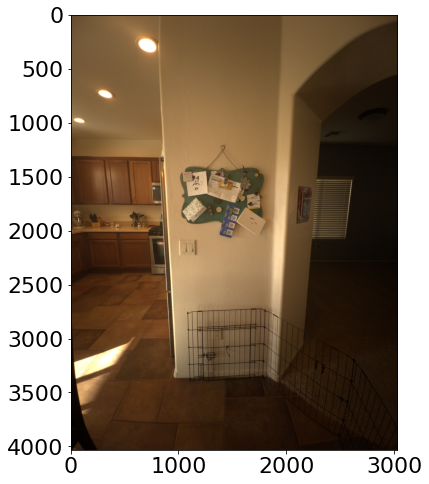

In [505]:
plt.imshow(raw.postprocess())

In [506]:
rawImage.shape

(3024, 4032)

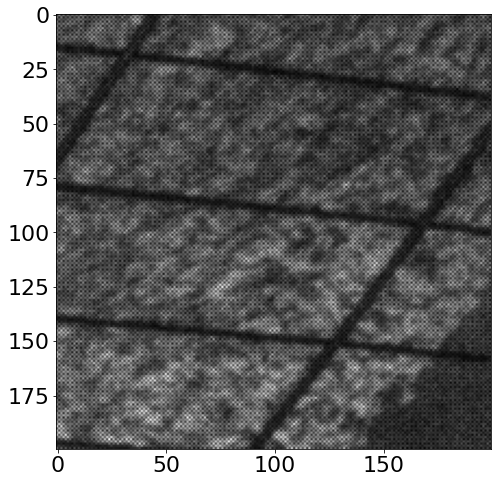

In [507]:
plt.imshow(rawImage[700:900,3400:3600],cmap='gray')
plt.axis('image')
plt.savefig('samsungTele.pdf')
#files.download('samsungTele.pdf')

In [510]:
b=rawImage[0:4032:2,0:3024:2]
r=rawImage[1:4032:2,1:3024:2]
g1=rawImage[1:4032:2,0:3024:2]
g2=rawImage[0:4032:2,1:3024:2]

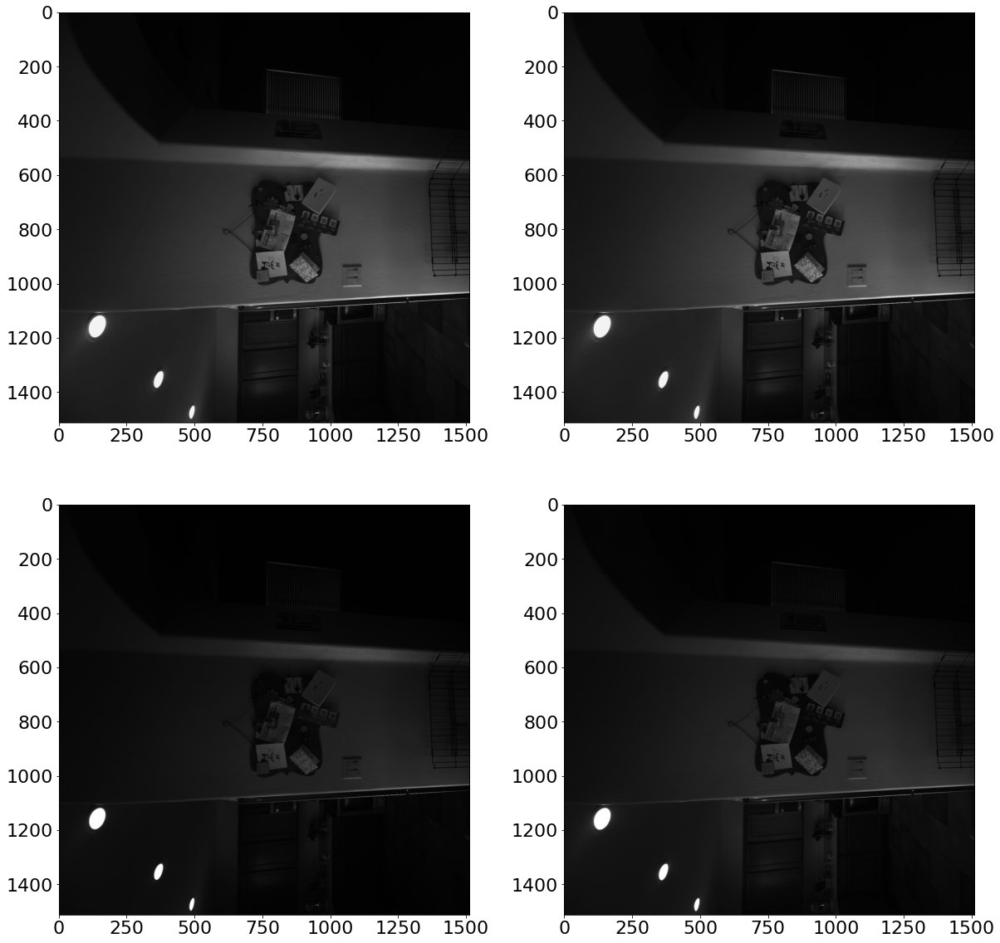

In [511]:
plt.figure(figsize=(20,20))
plt.subplot(2,2,1)
plt.imshow(g1,cmap="gray")
plt.subplot(2,2,2)
plt.imshow(g2,cmap="gray")
plt.subplot(2,2,3)
plt.imshow(r,cmap="gray")
plt.subplot(2,2,4)
plt.imshow(b,cmap="gray")
plt.savefig('samsungTeleRGGB.pdf')
#files.download('samsungTeleRGGB.pdf')

In [212]:
g1.dtype

dtype('uint16')

In [213]:
print(np.max(b), np.min(b))

4095 520


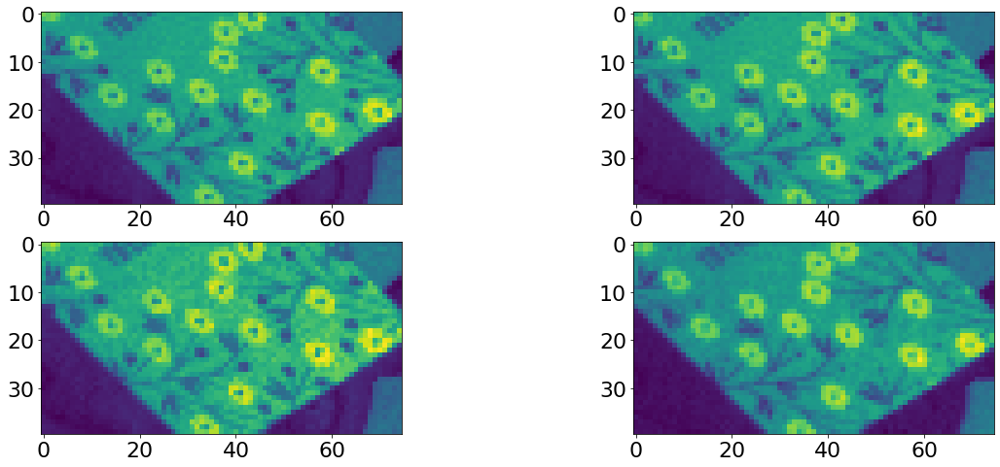

In [521]:
plt.subplot(2,2,1)
plt.imshow(g1[950:990,875:950])
plt.subplot(2,2,2)
plt.imshow(g2[950:990,875:950])
plt.subplot(2,2,3)
plt.imshow(r[950:990,875:950])
plt.subplot(2,2,4)
plt.imshow(b[950:990,875:950])

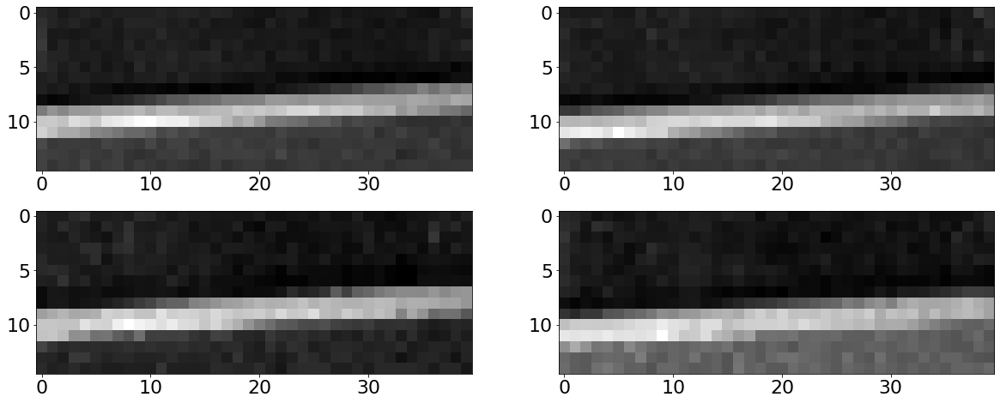

In [529]:
plt.rcParams['figure.figsize'] = [20, 8]
g1c=g1[1125:1140,810:850]
g2c=g2[1125:1140,810:850]
rc=r[1125:1140,810:850]
bc=b[1125:1140,810:850]
plt.subplot(2,2,1)
plt.imshow(g1c,cmap='gray')
plt.subplot(2,2,2)
plt.imshow(g2c,cmap='gray')
plt.subplot(2,2,3)
plt.imshow(rc,cmap='gray')
plt.subplot(2,2,4)
plt.imshow(bc, cmap='gray')
plt.savefig('samsungTeleEdge.pdf')
#files.download('samsungTeleEdge.pdf')

mean slope = -0.06435272045028143


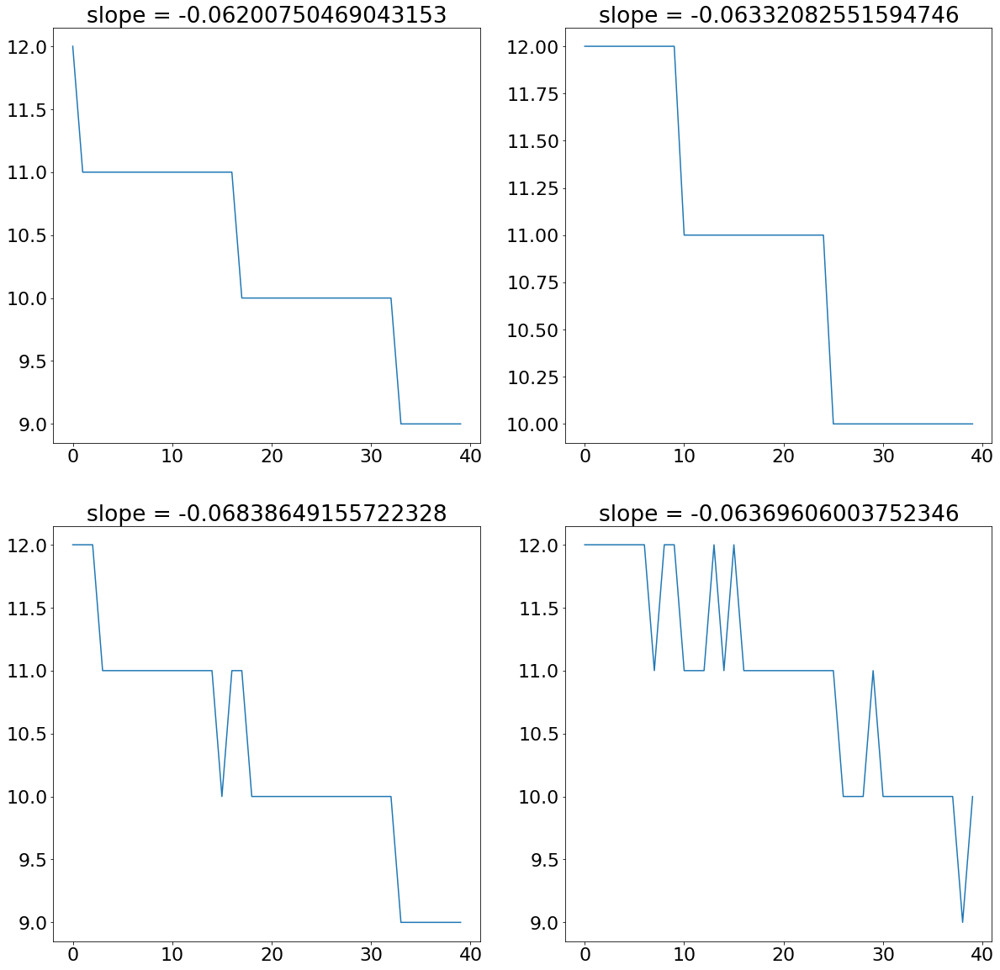

In [530]:
plt.figure(figsize=(20,20))
plt.subplot(2,2,1)
y=np.argmin(np.gradient(g1c, axis=0),axis=0)
reg=stats.linregress(np.arange(len(y)),y)
plt.plot(y)
plt.title('slope = '+str(reg.slope))
slope=reg.slope
plt.subplot(2,2,2)
y=np.argmin(np.gradient(g2c, axis=0),axis=0)
reg=stats.linregress(np.arange(len(y)),y)
plt.plot(y)
plt.title('slope = '+str(reg.slope))
slope=reg.slope+slope
plt.subplot(2,2,3)
y=np.argmin(np.gradient(rc, axis=0),axis=0)
reg=stats.linregress(np.arange(len(y)),y)
plt.plot(y)
plt.title('slope = '+str(reg.slope))
slope=reg.slope+slope
plt.subplot(2,2,4)
y=np.argmin(np.gradient(bc, axis=0),axis=0)
reg=stats.linregress(np.arange(len(y)),y)
plt.plot(y)
plt.title('slope = '+str(reg.slope))
slope=reg.slope+slope
slope=slope/4
print('mean slope =', slope)

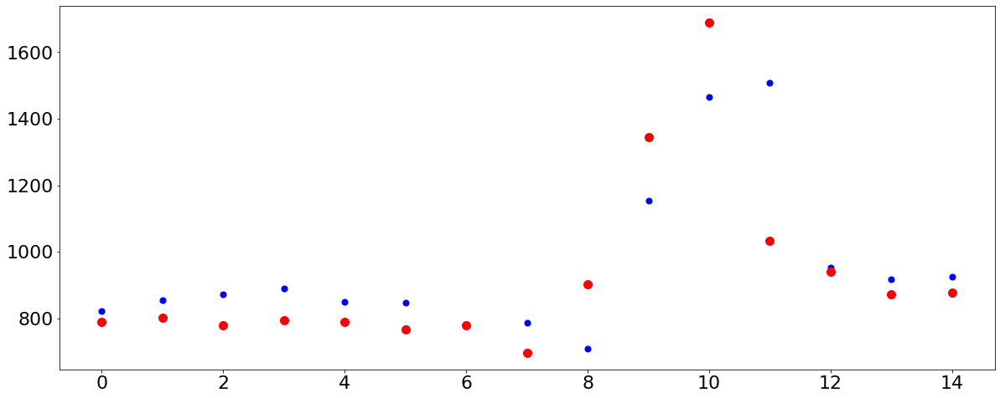

In [534]:
plt.scatter(np.arange(15),g1c[:,0], s=50, c='blue')
plt.scatter( np.arange(15),g1c[:,10], s=100,c='red')

In [533]:
np.size(g1c[:,0])

15

In [535]:
points=np.zeros((np.size(g2c),2))
for pop in np.arange(g2c.shape[0]):
  for pip in np.arange(g2c.shape[1]):
    points[pop*g2c.shape[1]+pip,:]=(pop-slope*pip,g2c[pop,pip])
points=points[points[:,0].argsort(),:]


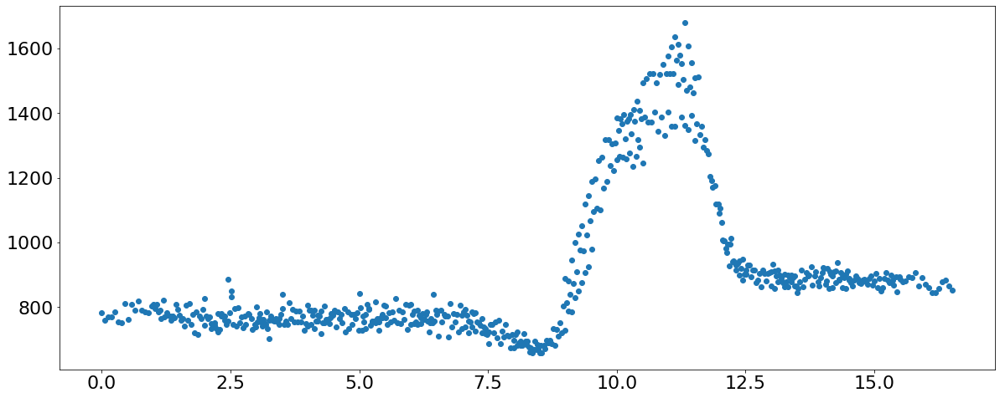

In [536]:
plt.scatter(points[:,0],points[:,1])

In [537]:
def erfunc(x, A, c, sig, off):
    return A*erf((x-c)/sig)+off

A , c, sig, off = -100., 6., 2., 150.


params, extras = curve_fit(erfunc, points[:,0],points[:,1],
                                    p0=[A, c, sig, off])

Text(0.5, 0, 'pixels')

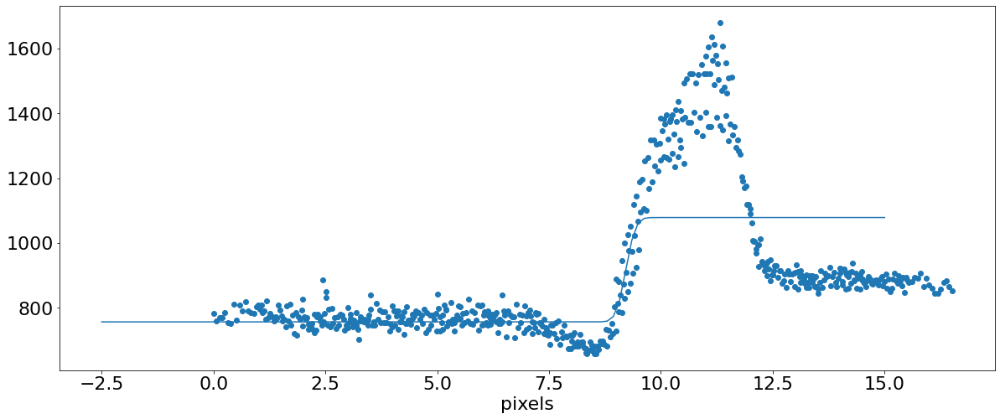

In [538]:
xx=np.linspace(-2.5,15,128)
plt.plot(xx, erfunc(xx, *params))
plt.scatter(points[:,0],points[:,1])
plt.xlabel('pixels')

Text(0.5, 0, 'microns')

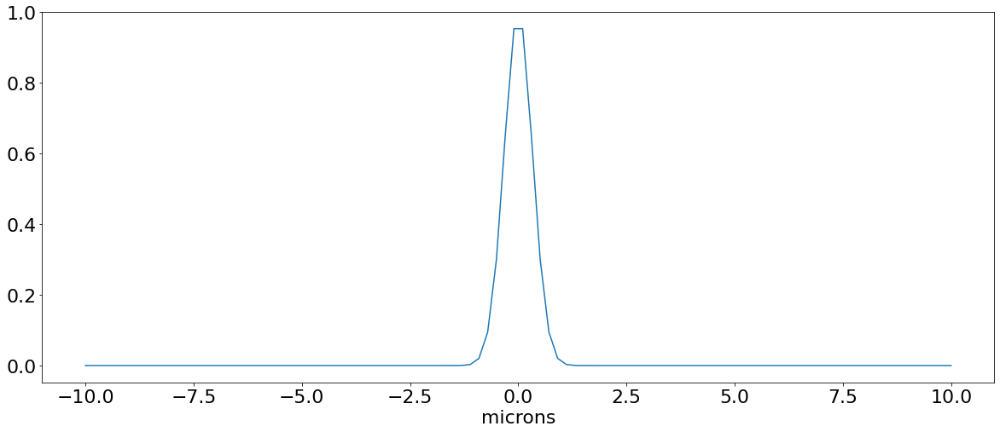

In [539]:
x=np.linspace(-10,10,100)
plt.plot(x, np.exp(-(x/(1.9*params[2]))**2))
plt.xlabel('microns')

In [540]:
params

array([1.60996048e+02, 9.21685617e+00, 2.42480899e-01, 9.17991652e+02])

In [541]:
var=params[2]

In [542]:
var

0.24248089933119166

Text(0, 0.5, 'mtf')

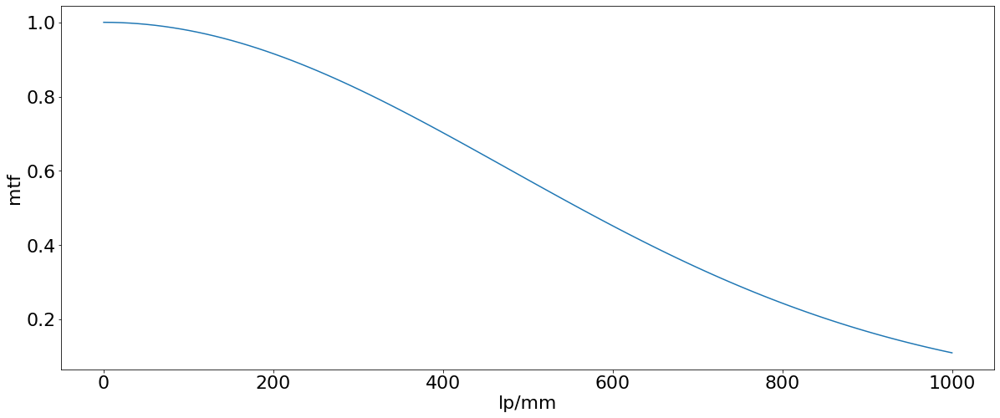

In [543]:
plt.plot(1000*np.linspace(0,1,100), np.exp(-(np.pi**2)*(3.8*var**2)*np.linspace(0,1,100)**2))
plt.xlabel("lp/mm")
plt.ylabel('mtf')

In [544]:
sfrData=np.array([[0,1],[50.25,0.892],[100.5,.657],[150,.425],[201,.304],[251,.253],[301,.188],[351,.067],[402,.037]])

Text(0, 0.5, 'mtf')

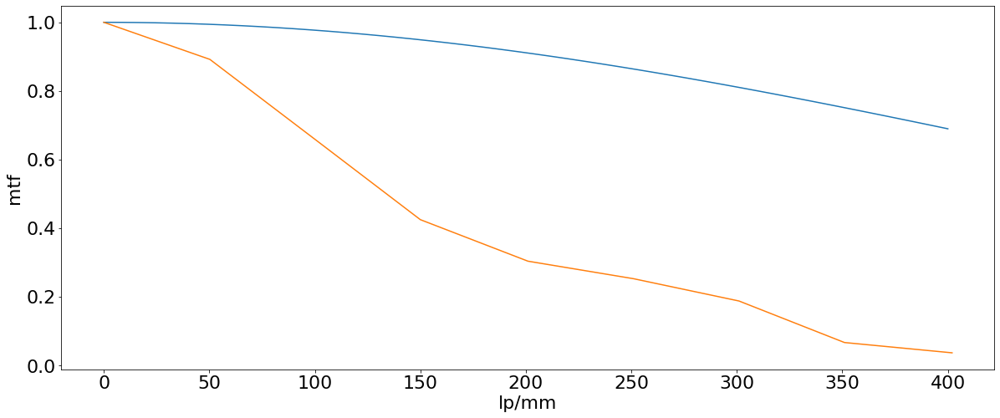

In [545]:
plt.plot(1000*np.linspace(0,.4,50), np.exp(-((np.pi))**2*(4*var**2)*np.linspace(0,.4,50)**2))
plt.plot(sfrData[:,0],sfrData[:,1])
plt.xlabel("lp/mm")
plt.ylabel('mtf')


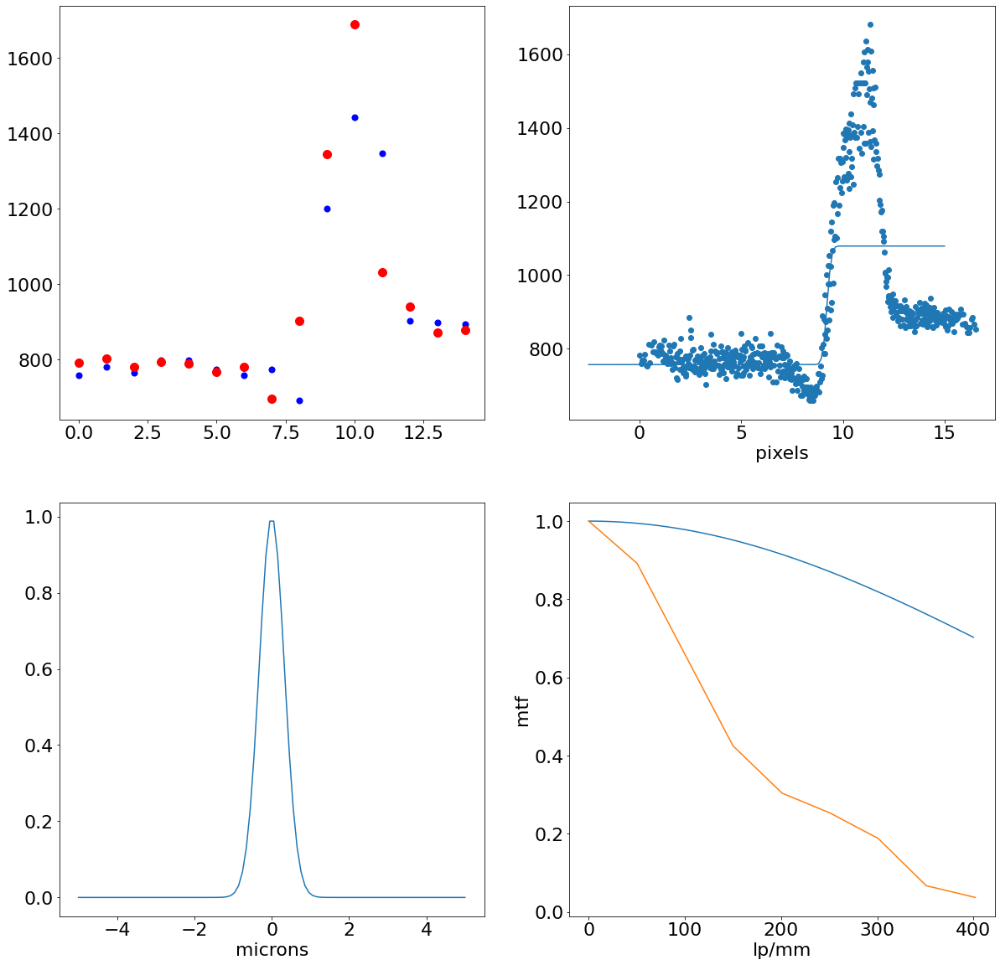

In [547]:
plt.figure(figsize=(20,20))
plt.subplot(2,2,1)
plt.scatter(np.arange(15),g1c[:,2], s=50, c='blue')
plt.scatter( np.arange(15),g1c[:,10], s=100,c='red')
plt.subplot(2,2,2)
plt.plot(xx, erfunc(xx, *params))
plt.scatter(points[:,0],points[:,1])
plt.xlabel('pixels')
plt.subplot(2,2,3)
x=np.linspace(-5,5,100)
plt.plot(x, np.exp(-(x/(1.9*params[2]))**2))
plt.xlabel('microns')
plt.subplot(2,2,4)
plt.plot(1000*np.linspace(0,.4,50), np.exp(-((np.pi))**2*(3.8*var**2)*np.linspace(0,.4,50)**2))
plt.plot(sfrData[:,0],sfrData[:,1])
plt.xlabel("lp/mm")
plt.ylabel('mtf')
plt.savefig('samsungTeleMTF.pdf')
#files.download('samsungTeleMTF.pdf')

## Telephoto lens

We consider below a photo taken with the ultrawide lens. 

iPhone 13 Pro Max
ƒ/1.8
1/2000
77mm
ISO 32

In [334]:
raw = rawpy.imread('/content/drive/MyDrive/Graduate School/OPTI 600C/IMG_7493.DNG')
rawImage=raw.raw_image_visible

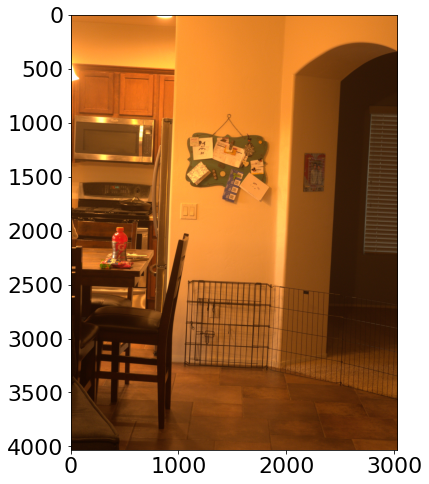

In [335]:
plt.imshow(raw.postprocess())

In [336]:
rawImage.shape

(3024, 4032)

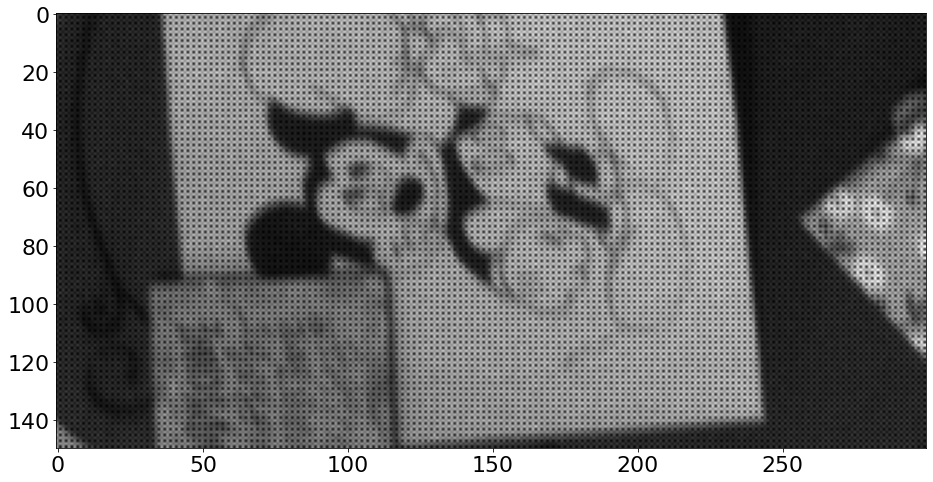

In [353]:
plt.imshow(rawImage[1750:1900,1100:1400],cmap='gray')
plt.axis('image')
plt.savefig('samsungTele.pdf')
#files.download('samsungTele.pdf')

In [570]:
b=rawImage[0:4032:2,0:3042:2]
r=rawImage[1:4032:2,1:3042:2]
g1=rawImage[1:4032:2,0:3042:2]
g2=rawImage[0:4032:2,1:3042:2]

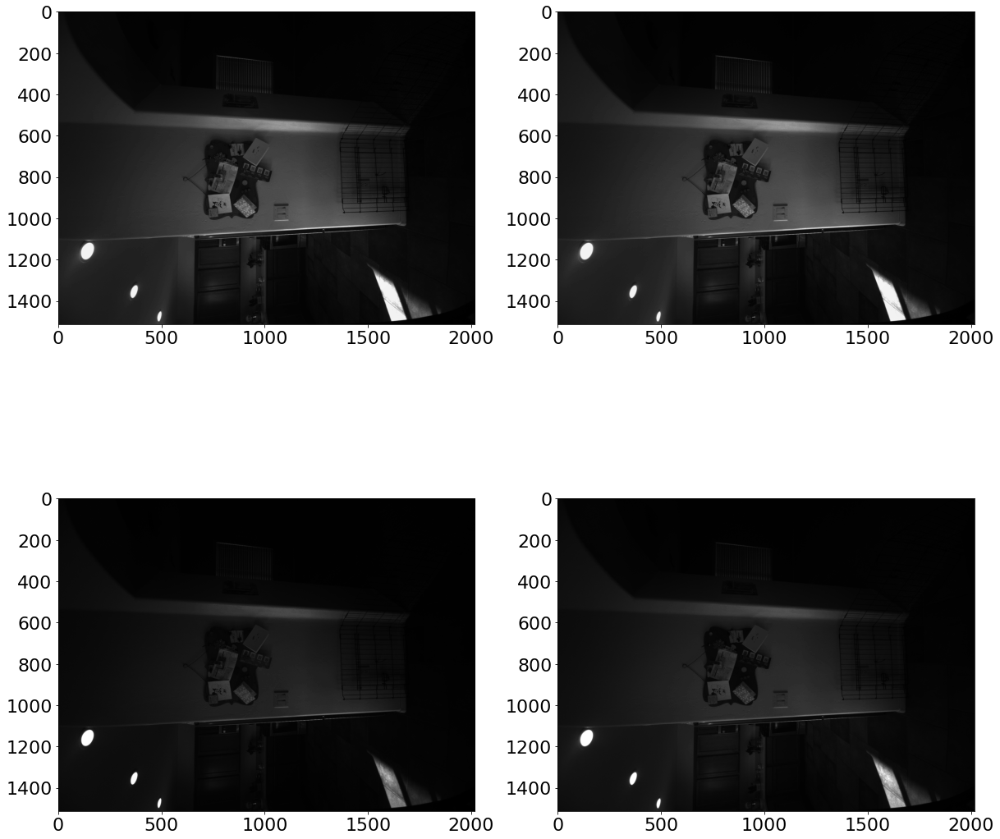

In [571]:
plt.figure(figsize=(20,20))
plt.subplot(2,2,1)
plt.imshow(g1,cmap="gray")
plt.subplot(2,2,2)
plt.imshow(g2,cmap="gray")
plt.subplot(2,2,3)
plt.imshow(r,cmap="gray")
plt.subplot(2,2,4)
plt.imshow(b,cmap="gray")
plt.savefig('samsungTeleRGGB.pdf')
#files.download('samsungTeleRGGB.pdf')

In [572]:
g1.dtype

dtype('uint16')

In [573]:
print(np.max(b), np.min(b))

4095 520


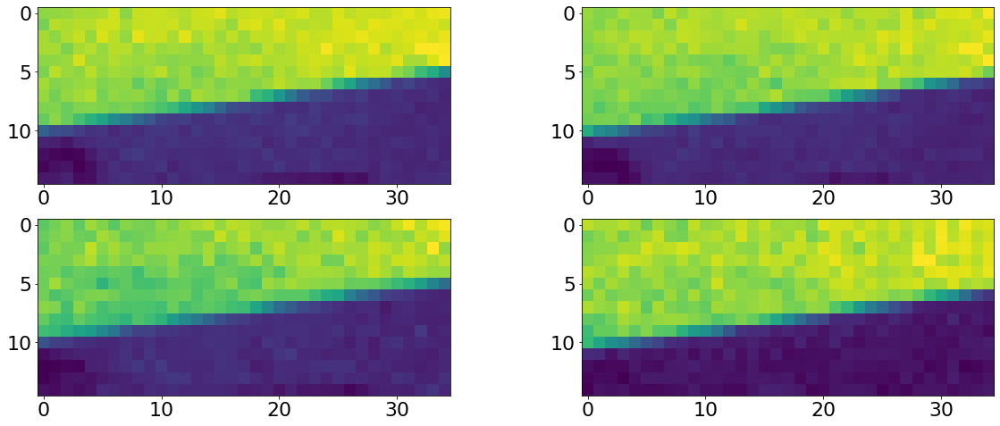

In [621]:
plt.subplot(2,2,1)
plt.imshow(g1[965:980,800:835])
plt.subplot(2,2,2)
plt.imshow(g2[965:980,800:835])
plt.subplot(2,2,3)
plt.imshow(r[965:980,800:835])
plt.subplot(2,2,4)
plt.imshow(b[965:980,800:835])

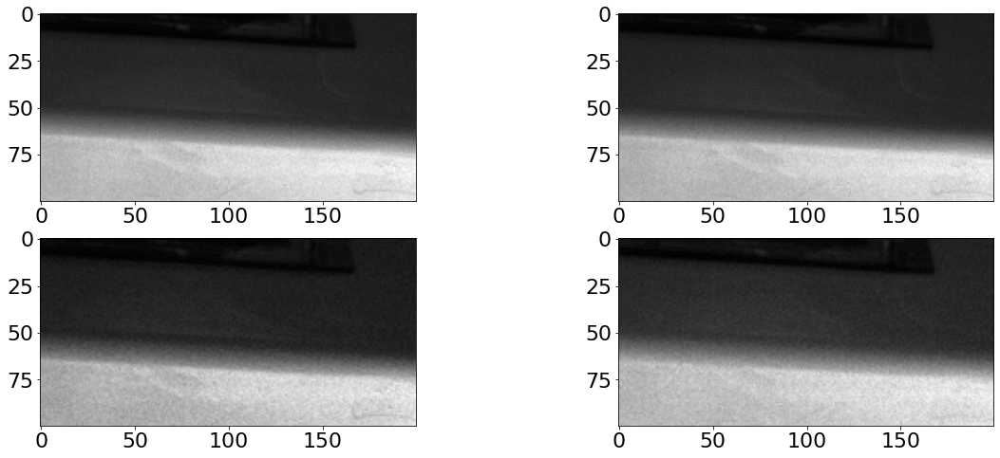

In [622]:
plt.rcParams['figure.figsize'] = [20, 8]
g1c=g1[450:550,800:1000]
g2c=g2[450:550,800:1000]
rc=r[450:550,800:1000]
bc=b[450:550,800:1000]
plt.subplot(2,2,1)
plt.imshow(g1c,cmap='gray')
plt.subplot(2,2,2)
plt.imshow(g2c,cmap='gray')
plt.subplot(2,2,3)
plt.imshow(rc,cmap='gray')
plt.subplot(2,2,4)
plt.imshow(bc, cmap='gray')
plt.savefig('samsungTeleEdge.pdf')
#files.download('samsungTeleEdge.pdf')

mean slope = 0.05263819095477387


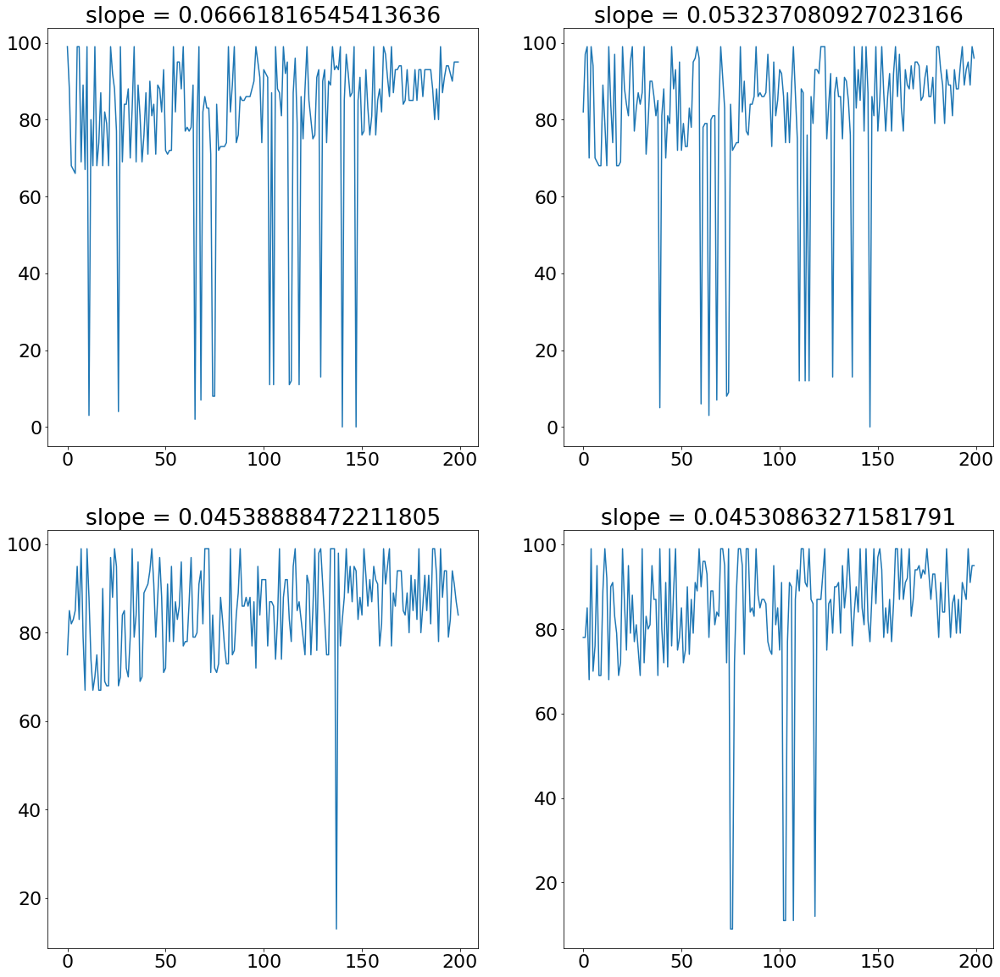

In [623]:
plt.figure(figsize=(20,20))
plt.subplot(2,2,1)
y=np.argmin(np.gradient(g1c, axis=0),axis=0)
reg=stats.linregress(np.arange(len(y)),y)
plt.plot(y)
plt.title('slope = '+str(reg.slope))
slope=reg.slope
plt.subplot(2,2,2)
y=np.argmin(np.gradient(g2c, axis=0),axis=0)
reg=stats.linregress(np.arange(len(y)),y)
plt.plot(y)
plt.title('slope = '+str(reg.slope))
slope=reg.slope+slope
plt.subplot(2,2,3)
y=np.argmin(np.gradient(rc, axis=0),axis=0)
reg=stats.linregress(np.arange(len(y)),y)
plt.plot(y)
plt.title('slope = '+str(reg.slope))
slope=reg.slope+slope
plt.subplot(2,2,4)
y=np.argmin(np.gradient(bc, axis=0),axis=0)
reg=stats.linregress(np.arange(len(y)),y)
plt.plot(y)
plt.title('slope = '+str(reg.slope))
slope=reg.slope+slope
slope=slope/4
print('mean slope =', slope)

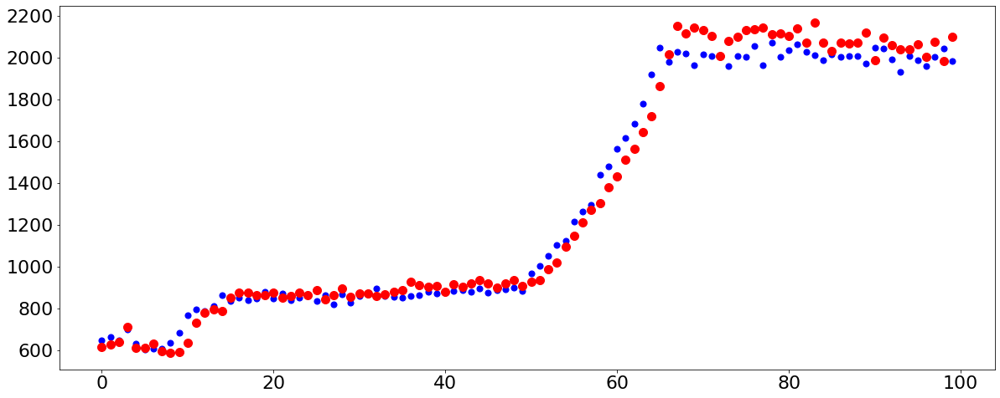

In [624]:
plt.scatter(np.arange(100),g1c[:,0], s=50, c='blue')
plt.scatter( np.arange(100),g1c[:,29], s=100,c='red')

In [626]:
points=np.zeros((np.size(g2c),2))
for pop in np.arange(g2c.shape[0]):
  for pip in np.arange(g2c.shape[1]):
    points[pop*g2c.shape[1]+pip,:]=(pop-slope*pip,g2c[pop,pip])
points=points[points[:,0].argsort(),:]


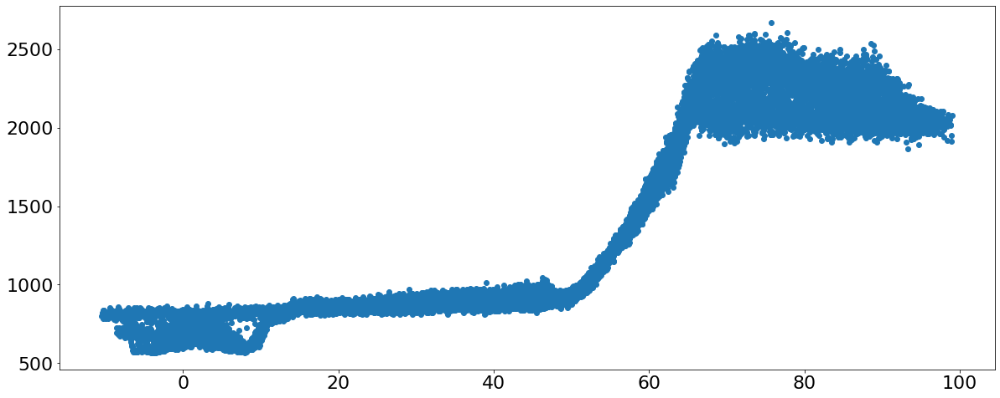

In [627]:
plt.scatter(points[:,0],points[:,1])

In [628]:
def erfunc(x, A, c, sig, off):
    return A*erf((x-c)/sig)+off

A , c, sig, off = -100., 6., 2., 150.


params, extras = curve_fit(erfunc, points[:,0],points[:,1],
                                    p0=[A, c, sig, off])

Text(0.5, 0, 'pixels')

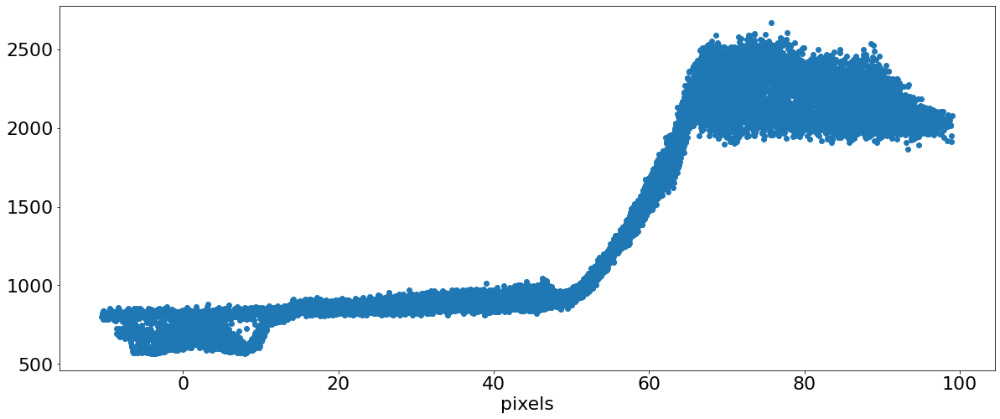

In [629]:
xx=np.linspace(-2.5,15,128)
plt.plot(xx, erfunc(xx, *params))
plt.scatter(points[:,0],points[:,1])
plt.xlabel('pixels')

Text(0.5, 0, 'microns')

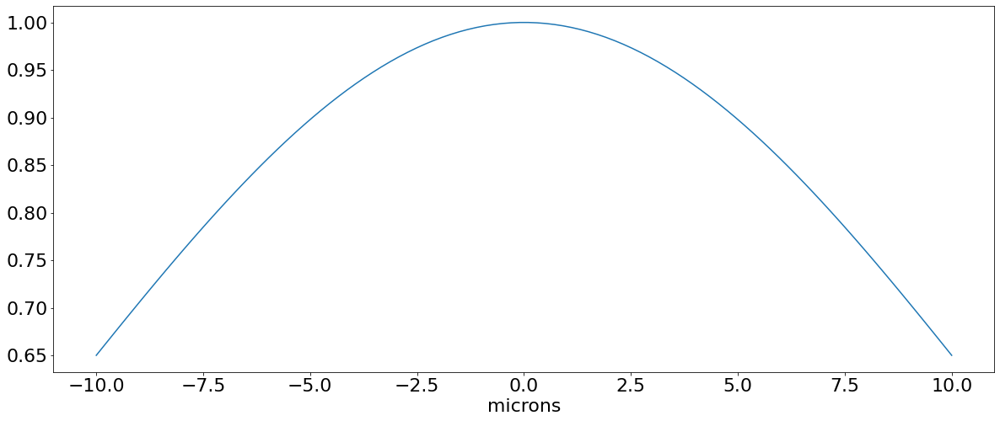

In [630]:
x=np.linspace(-10,10,100)
plt.plot(x, np.exp(-(x/(1.9*params[2]))**2))
plt.xlabel('microns')

In [631]:
params

array([ 696.7735778 ,   58.85582317,    8.01911633, 1518.57203995])

In [632]:
var=params[2]

In [633]:
var

8.01911632966798

Text(0, 0.5, 'mtf')

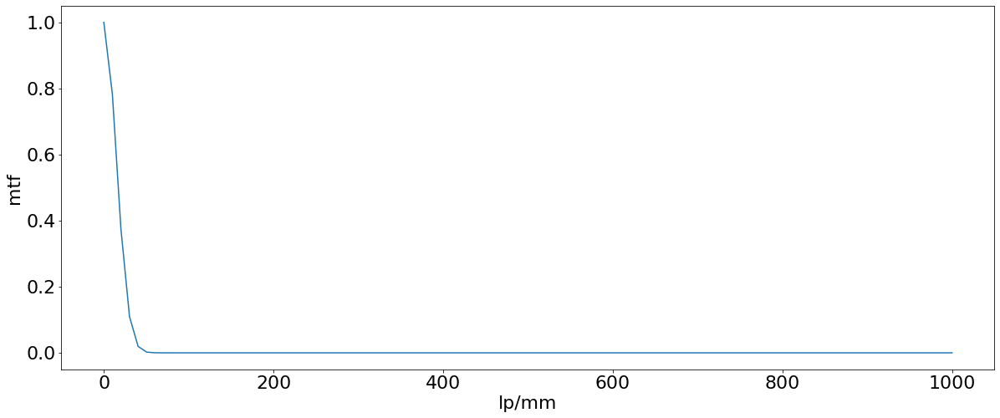

In [634]:
plt.plot(1000*np.linspace(0,1,100), np.exp(-(np.pi**2)*(3.8*var**2)*np.linspace(0,1,100)**2))
plt.xlabel("lp/mm")
plt.ylabel('mtf')

In [635]:
sfrData=np.array([[0,1],[50.25,0.892],[100.5,.657],[150,.425],[201,.304],[251,.253],[301,.188],[351,.067],[402,.037]])

Text(0, 0.5, 'mtf')

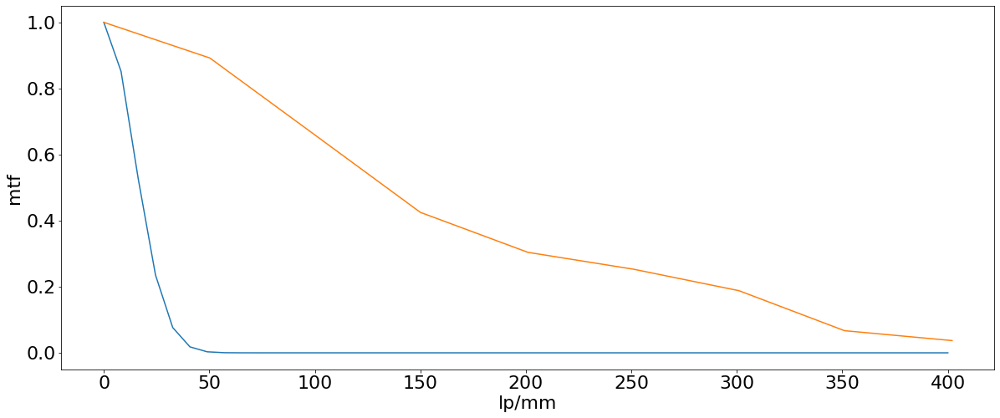

In [636]:
plt.plot(1000*np.linspace(0,.4,50), np.exp(-((np.pi))**2*(3.8*var**2)*np.linspace(0,.4,50)**2))
plt.plot(sfrData[:,0],sfrData[:,1])
plt.xlabel("lp/mm")
plt.ylabel('mtf')


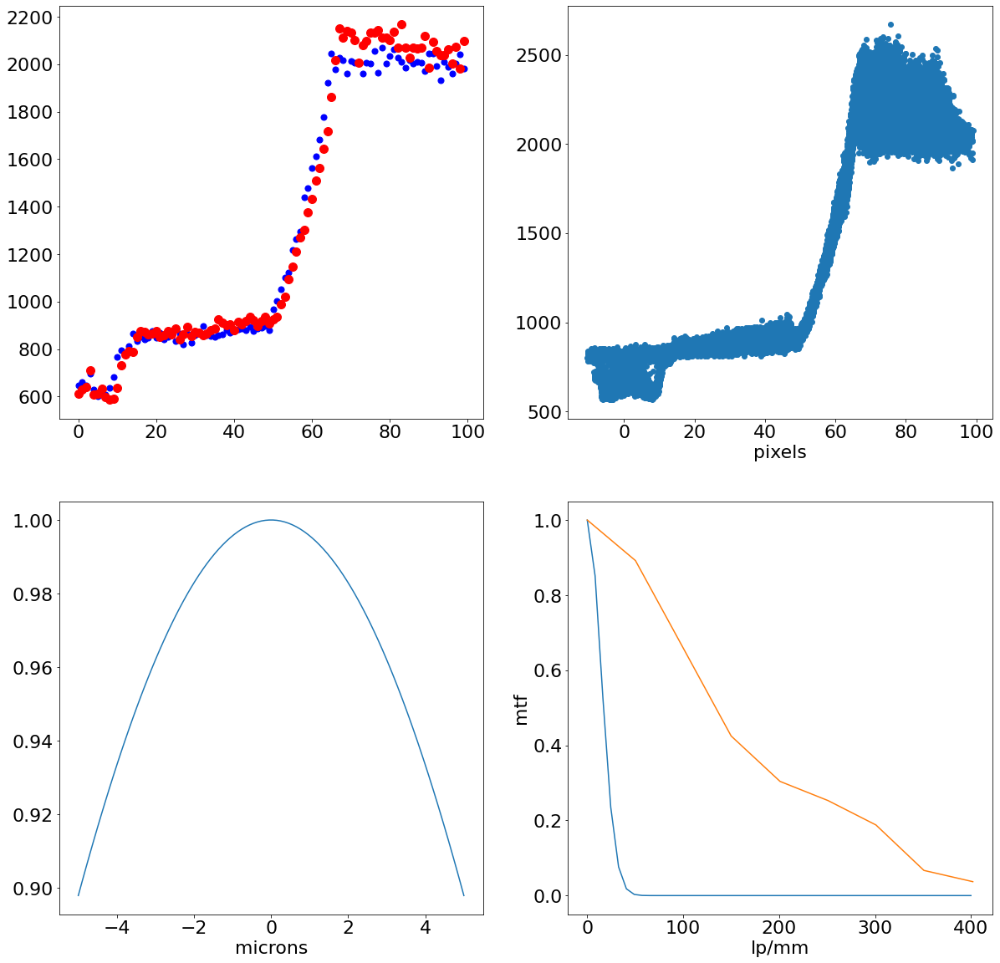

In [637]:
plt.figure(figsize=(20,20))
plt.subplot(2,2,1)
plt.scatter(np.arange(100),g1c[:,0], s=50, c='blue')
plt.scatter( np.arange(100),g1c[:,29], s=100,c='red')
plt.subplot(2,2,2)
plt.plot(xx, erfunc(xx, *params))
plt.scatter(points[:,0],points[:,1])
plt.xlabel('pixels')
plt.subplot(2,2,3)
x=np.linspace(-5,5,100)
plt.plot(x, np.exp(-(x/(1.9*params[2]))**2))
plt.xlabel('microns')
plt.subplot(2,2,4)
plt.plot(1000*np.linspace(0,.4,50), np.exp(-((np.pi))**2*(3.8*var**2)*np.linspace(0,.4,50)**2))
plt.plot(sfrData[:,0],sfrData[:,1])
plt.xlabel("lp/mm")
plt.ylabel('mtf')
plt.savefig('samsungTeleMTF.pdf')
#files.download('samsungTeleMTF.pdf')

The MTF got worse the farther away the photo was taken, which makes sense as it is harder to discriminate the edges. 


---



# Histogram Analysis



In [62]:
raw = rawpy.imread('/content/drive/MyDrive/Graduate School/OPTI 600C/IMG_7506.DNG')
rawImage=raw.raw_image_visible

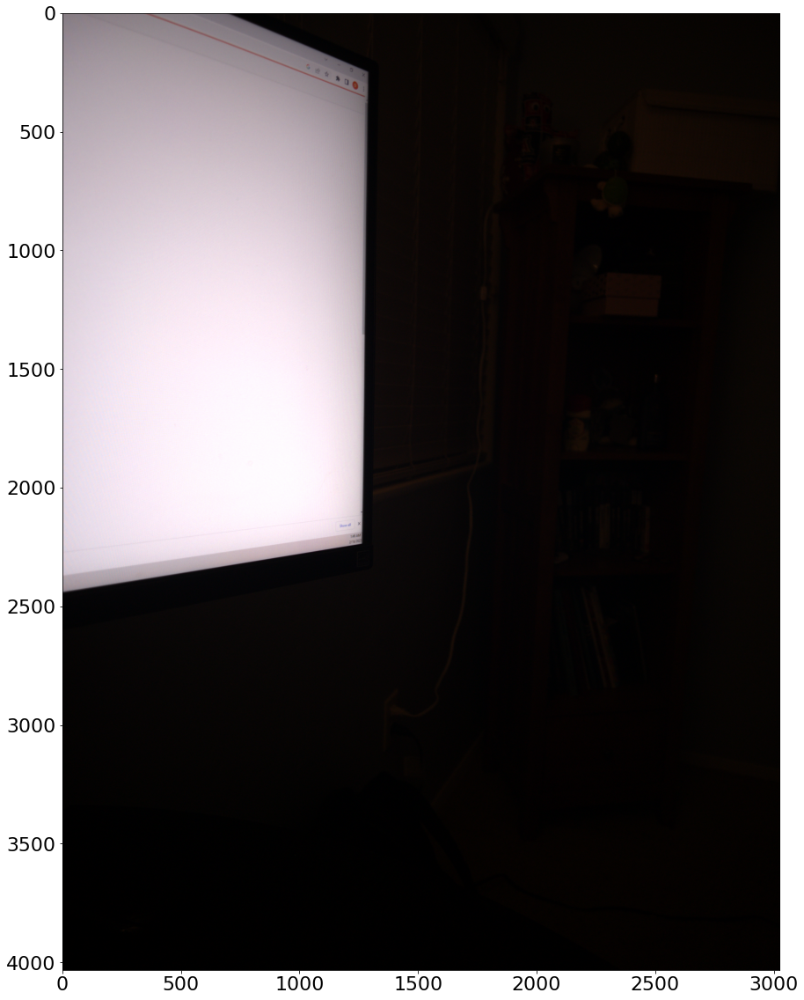

In [63]:
plt.imshow(raw.postprocess())

In [64]:
b=rawImage[0:4032:2,0:3024:2]
r=rawImage[1:4032:2,1:3024:2]
g1=rawImage[1:4032:2,0:3024:2]
g2=rawImage[0:4032:2,1:3024:2]

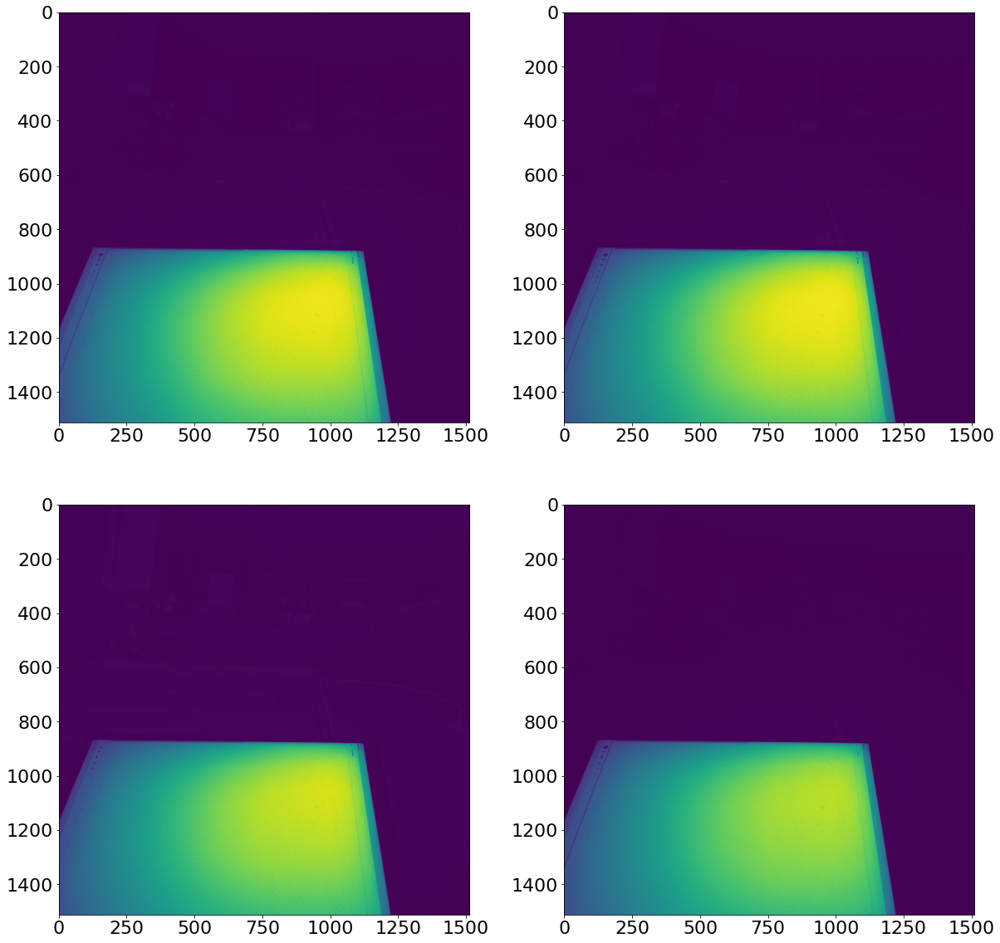

In [65]:
plt.subplot(2,2,1)
plt.imshow(g1)
plt.subplot(2,2,2)
plt.imshow(g2)
plt.subplot(2,2,3)
plt.imshow(r)
plt.subplot(2,2,4)
plt.imshow(b)

(array([1560050.,   13867.,   47446.,   74630.,   89274.,   80117.,
         111323.,  161675.,  131939.,   15823.]),
 array([ 523. ,  779.9, 1036.8, 1293.7, 1550.6, 1807.5, 2064.4, 2321.3,
        2578.2, 2835.1, 3092. ]),
 <a list of 10 Patch objects>)

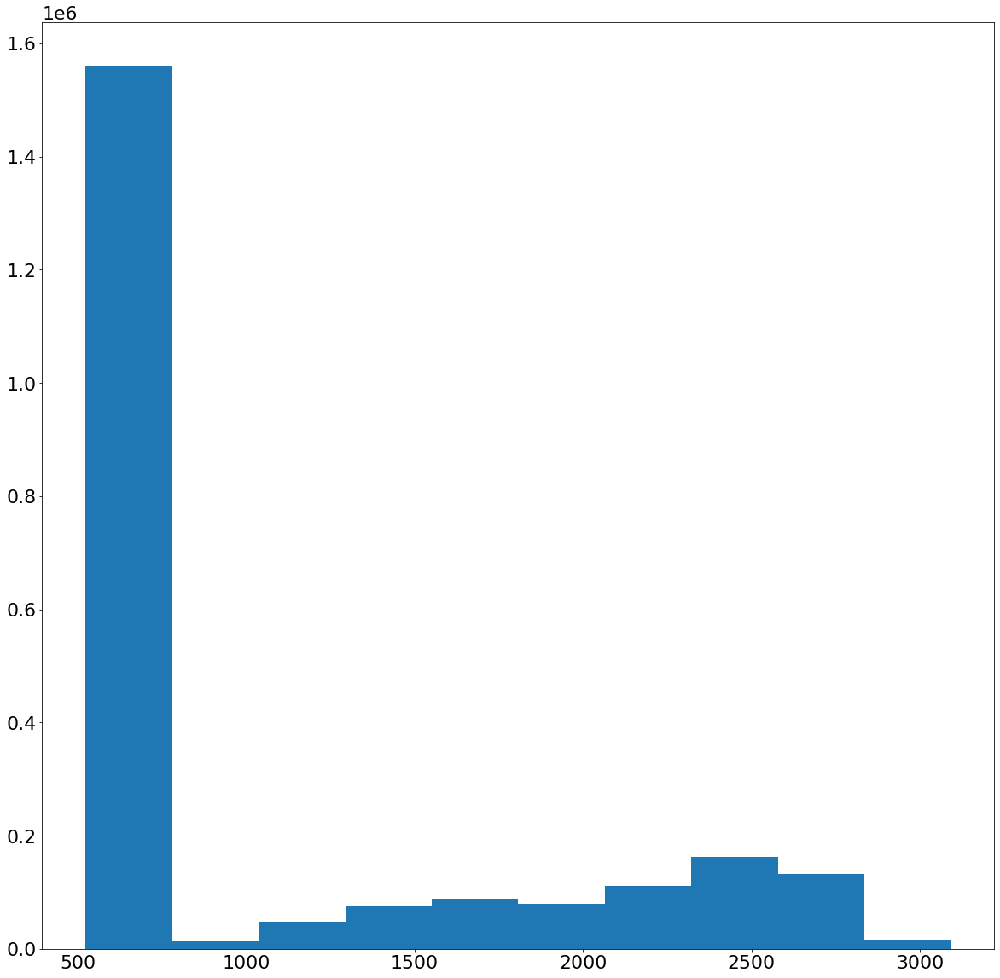

In [66]:
plt.hist(b.ravel())

In [78]:
DynamicRangeBit = round(np.log2(max(b.ravel())))
print(DynamicRangeBit)

12


(array([1559224.,   11014.,   41389.,   65715.,   84358.,   85064.,
          93078.,  149107.,  140577.,   56618.]),
 array([ 523.,  680.,  837.,  994., 1151., 1308., 1465., 1622., 1779.,
        1936., 2093.]),
 <a list of 10 Patch objects>)

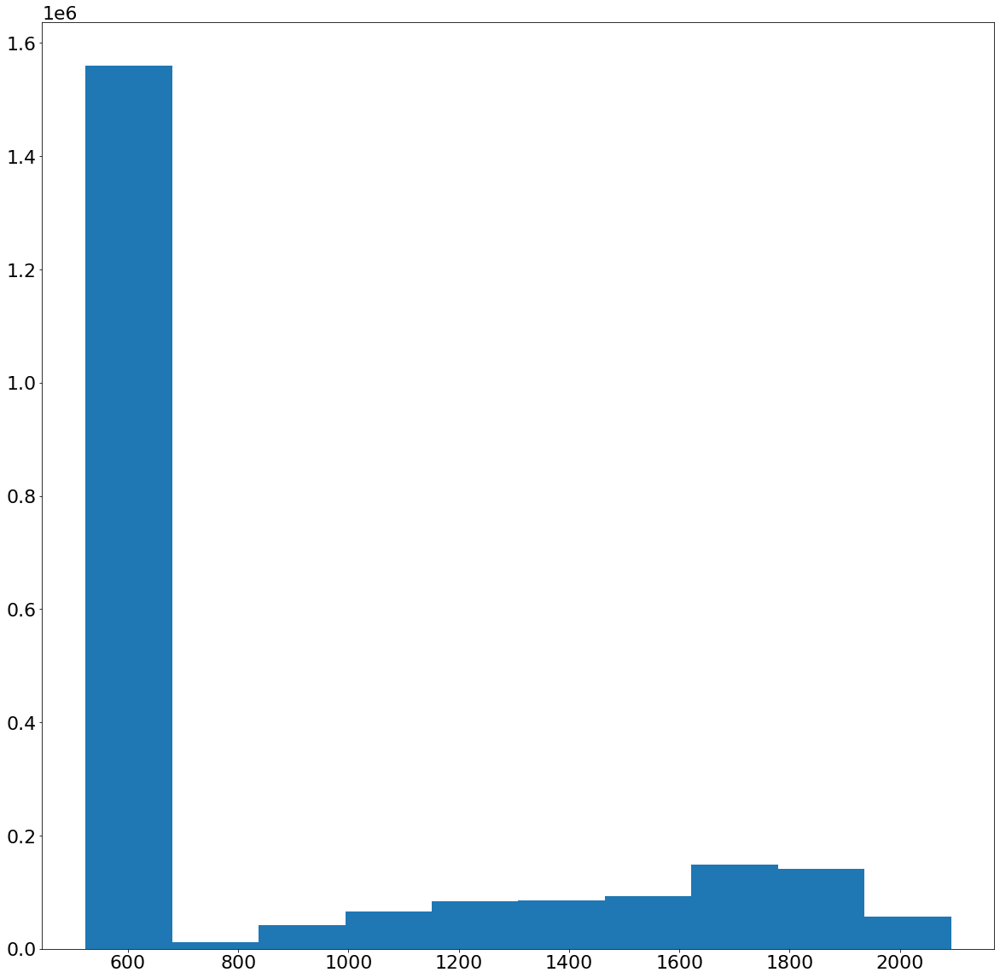

In [68]:
plt.hist(r.ravel())

In [ ]:
DynamicRangeBit = round(np.log2(max(r.ravel())))
print(DynamicRangeBit)

12


(array([1559105.,   10061.,   34272.,   61150.,   79180.,   77434.,
          82100.,  123736.,  137998.,  121108.]),
 array([ 523. ,  879.4, 1235.8, 1592.2, 1948.6, 2305. , 2661.4, 3017.8,
        3374.2, 3730.6, 4087. ]),
 <a list of 10 Patch objects>)

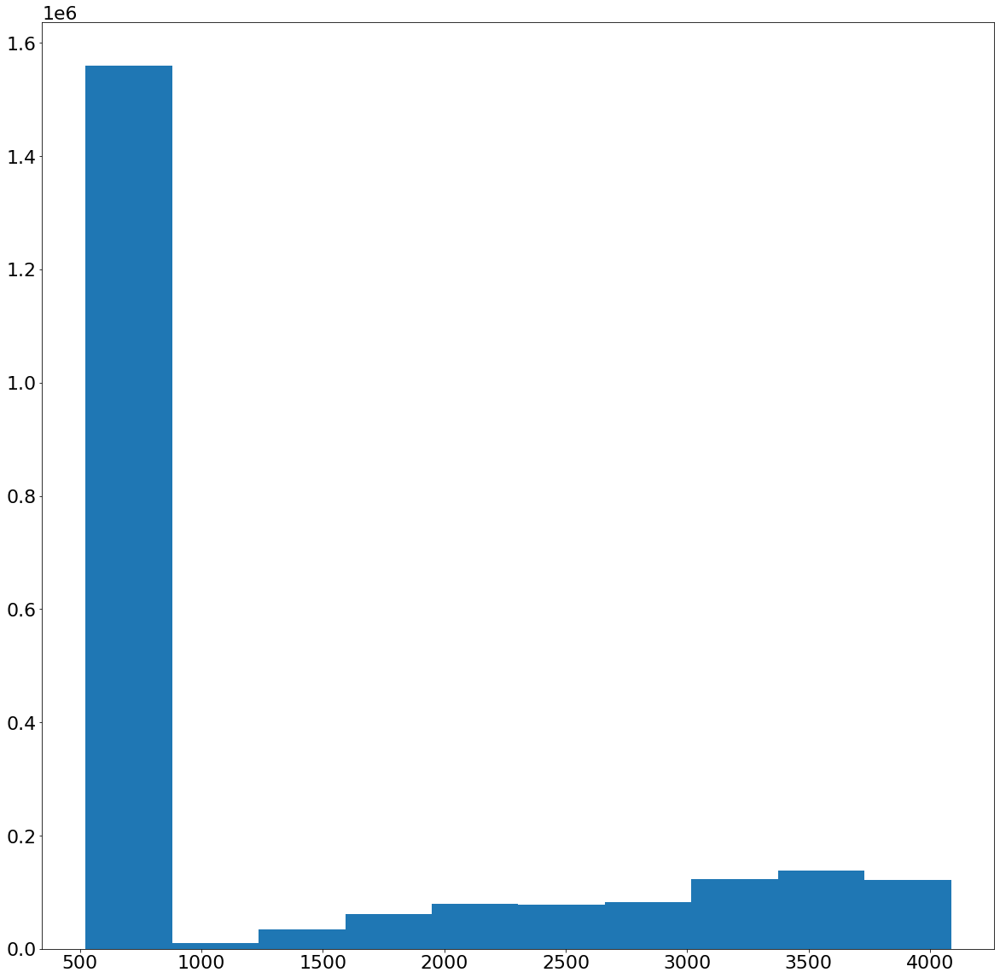

In [70]:
plt.hist(g1.ravel())

In [80]:
DynamicRangeBit = round(np.log2(max(g1.ravel())))
print(DynamicRangeBit)

12


(array([1.469251e+06, 3.988130e+05, 3.299000e+03, 1.544000e+03,
        1.144000e+03, 9.870000e+02, 8.310000e+02, 7.170000e+02,
        6.610000e+02, 4.088970e+05]),
 array([ 536. ,  890.2, 1244.4, 1598.6, 1952.8, 2307. , 2661.2, 3015.4,
        3369.6, 3723.8, 4078. ]),
 <a list of 10 Patch objects>)

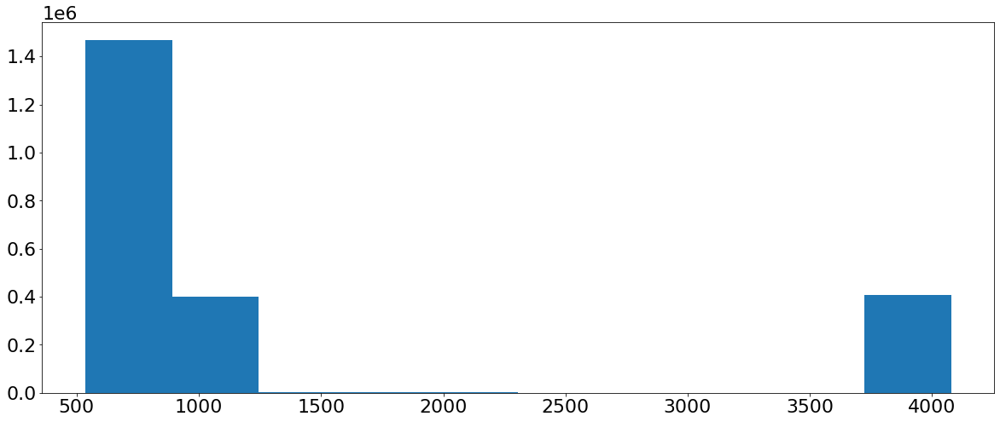

In [705]:
plt.hist(g2.ravel())

In [81]:
DynamicRangeBit = round(np.log2(max(g2.ravel())))
print(DynamicRangeBit)

12


In [82]:
raw = rawpy.imread('/content/drive/MyDrive/Graduate School/OPTI 600C/IMG_7498.DNG')
rawImage=raw.raw_image_visible

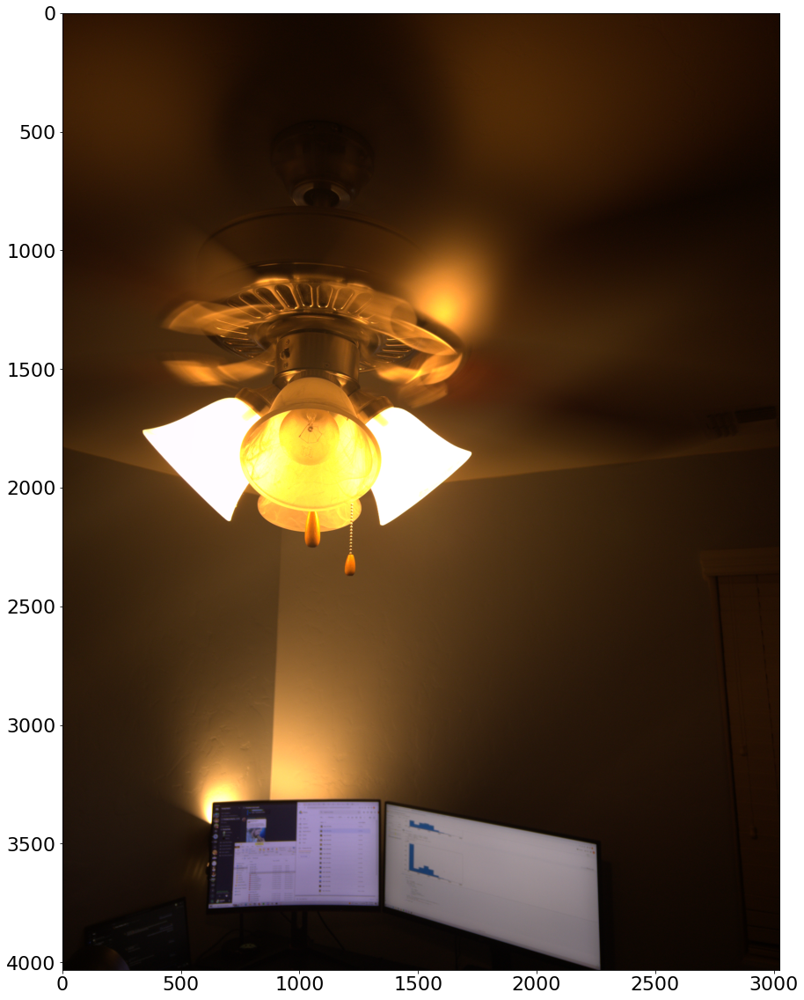

In [83]:
plt.imshow(raw.postprocess())

In [84]:
b=rawImage[0:4032:2,0:3024:2]
r=rawImage[1:4032:2,1:3024:2]
g1=rawImage[1:4032:2,0:3024:2]
g2=rawImage[0:4032:2,1:3024:2]

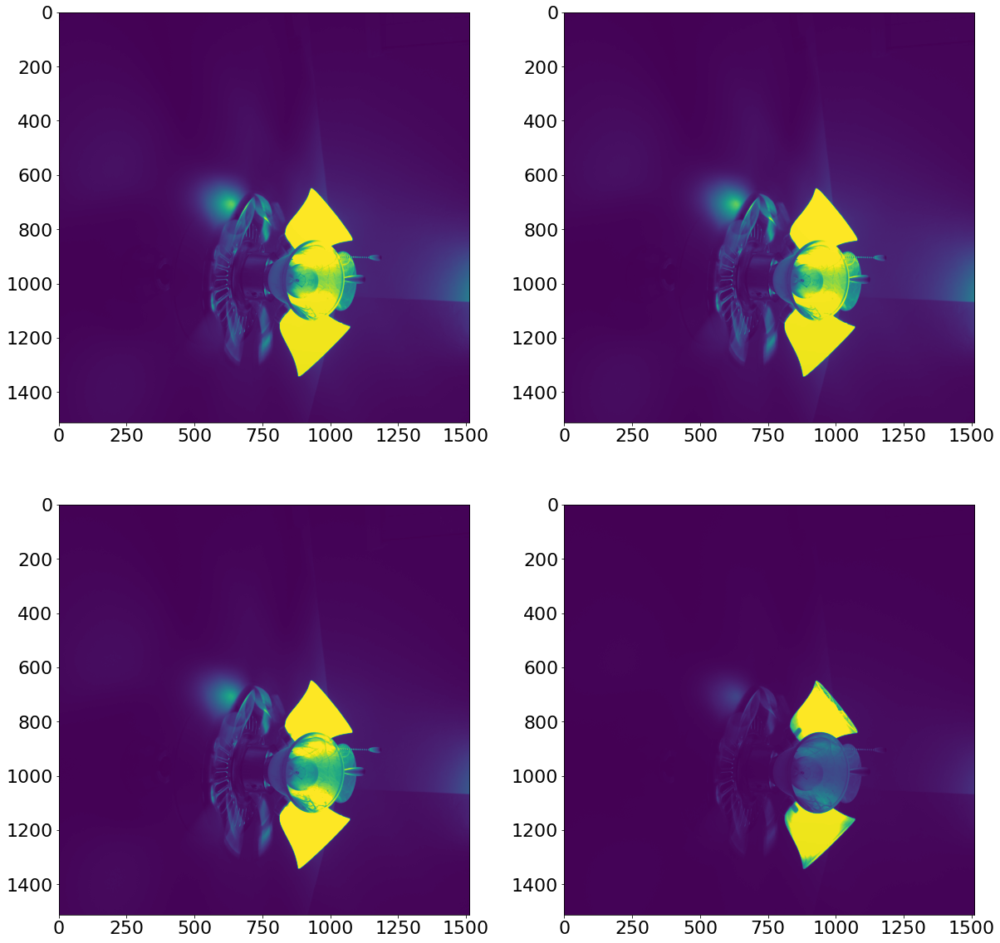

In [85]:
plt.subplot(2,2,1)
plt.imshow(g1)
plt.subplot(2,2,2)
plt.imshow(g2)
plt.subplot(2,2,3)
plt.imshow(r)
plt.subplot(2,2,4)
plt.imshow(b)

(array([2.148702e+06, 3.448900e+04, 2.584100e+04, 1.310800e+04,
        3.455000e+03, 1.218000e+03, 2.195000e+03, 3.295000e+03,
        3.478000e+03, 5.036300e+04]),
 array([ 528. ,  884.7, 1241.4, 1598.1, 1954.8, 2311.5, 2668.2, 3024.9,
        3381.6, 3738.3, 4095. ]),
 <a list of 10 Patch objects>)

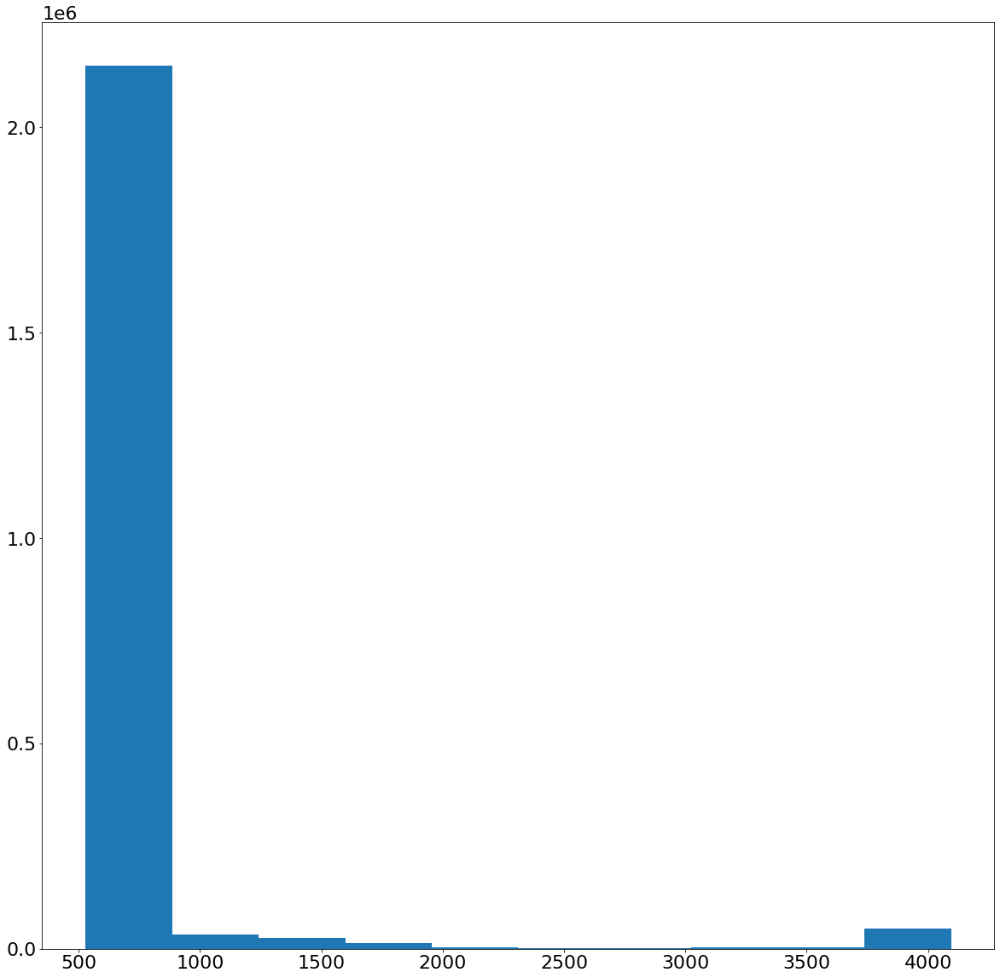

In [86]:
plt.hist(b.ravel())

In [87]:
DynamicRangeBit = round(np.log2(max(b.ravel())))
print(DynamicRangeBit)

12


(array([2050500.,   78354.,   23835.,   13466.,    9034.,   10491.,
          12232.,    7131.,    5096.,   76005.]),
 array([ 535.,  891., 1247., 1603., 1959., 2315., 2671., 3027., 3383.,
        3739., 4095.]),
 <a list of 10 Patch objects>)

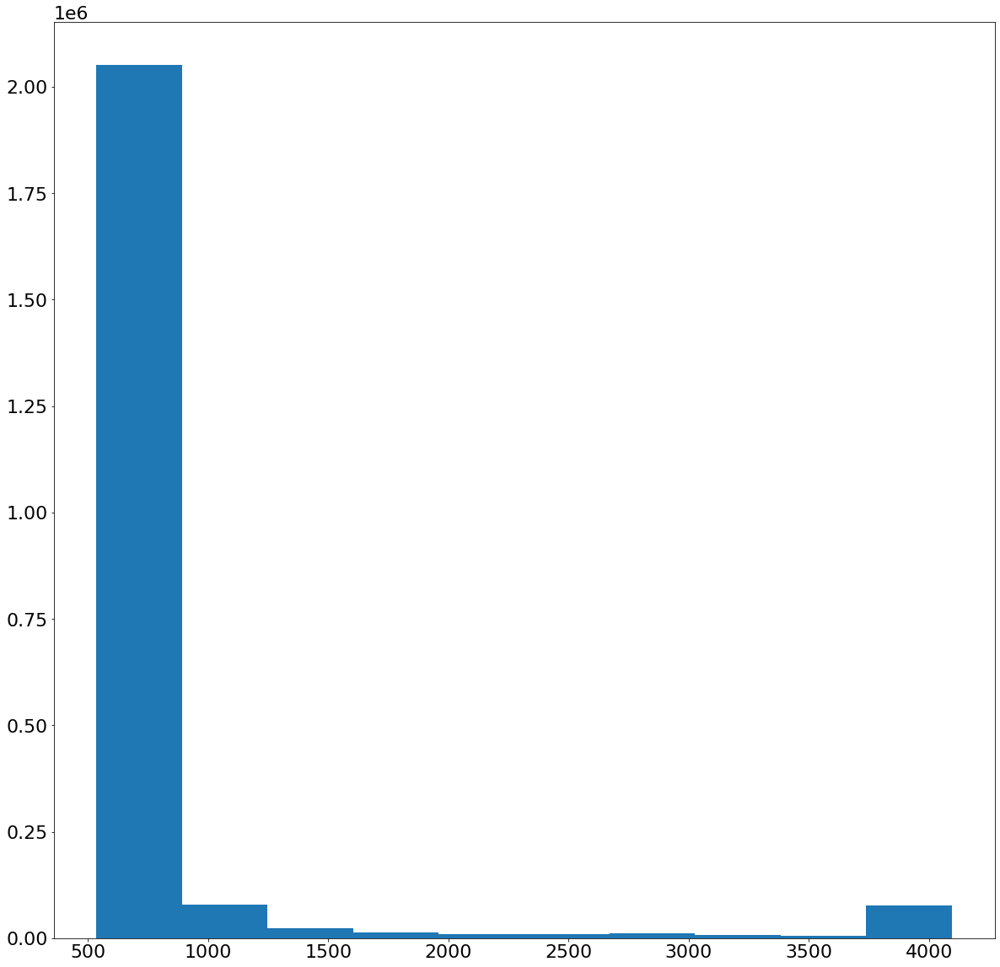

In [88]:
plt.hist(r.ravel())

In [89]:
DynamicRangeBit = round(np.log2(max(r.ravel())))
print(DynamicRangeBit)

12


(array([1955381.,  143961.,   39959.,   16011.,   10956.,    7465.,
           6493.,    8192.,    9909.,   87817.]),
 array([ 539. ,  894.6, 1250.2, 1605.8, 1961.4, 2317. , 2672.6, 3028.2,
        3383.8, 3739.4, 4095. ]),
 <a list of 10 Patch objects>)

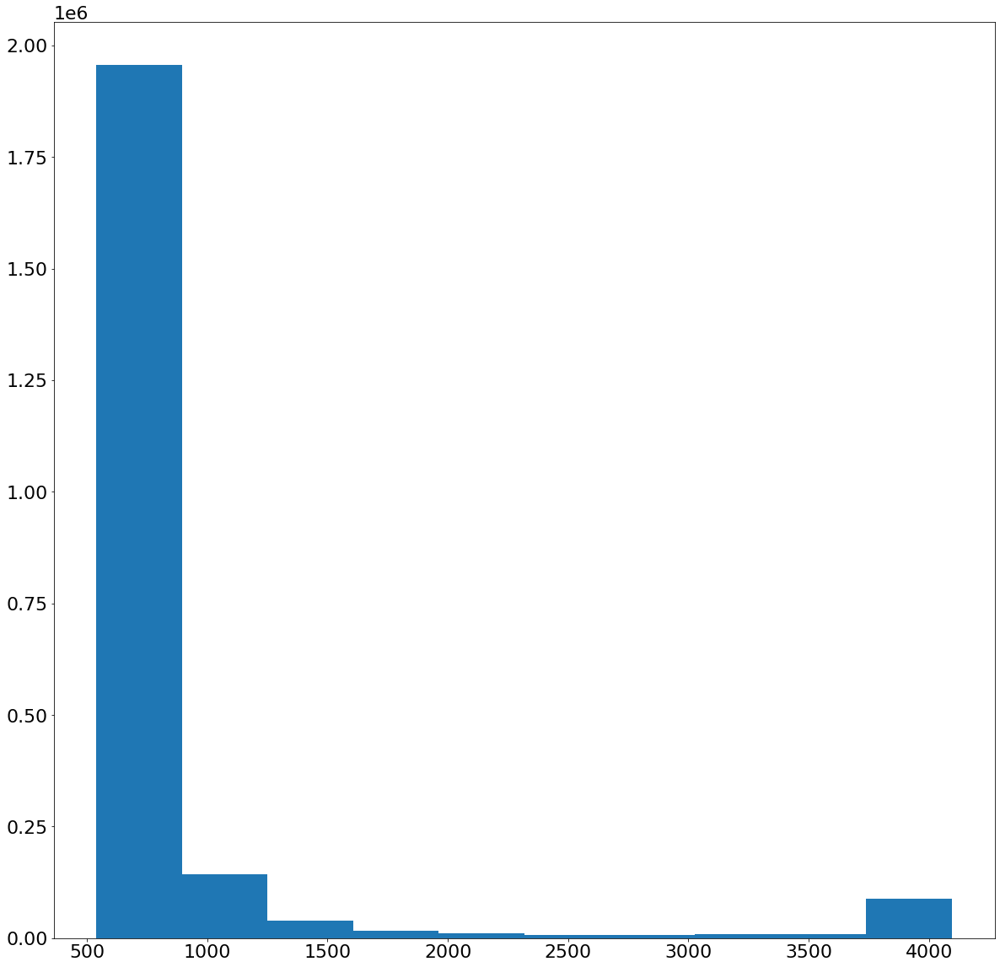

In [90]:
plt.hist(g1.ravel())

In [91]:
DynamicRangeBit = round(np.log2(max(g1.ravel())))
print(DynamicRangeBit)

12


(array([1955393.,  143813.,   40035.,   15995.,   10843.,    7391.,
           6691.,    8273.,    9704.,   88006.]),
 array([ 539. ,  894.6, 1250.2, 1605.8, 1961.4, 2317. , 2672.6, 3028.2,
        3383.8, 3739.4, 4095. ]),
 <a list of 10 Patch objects>)

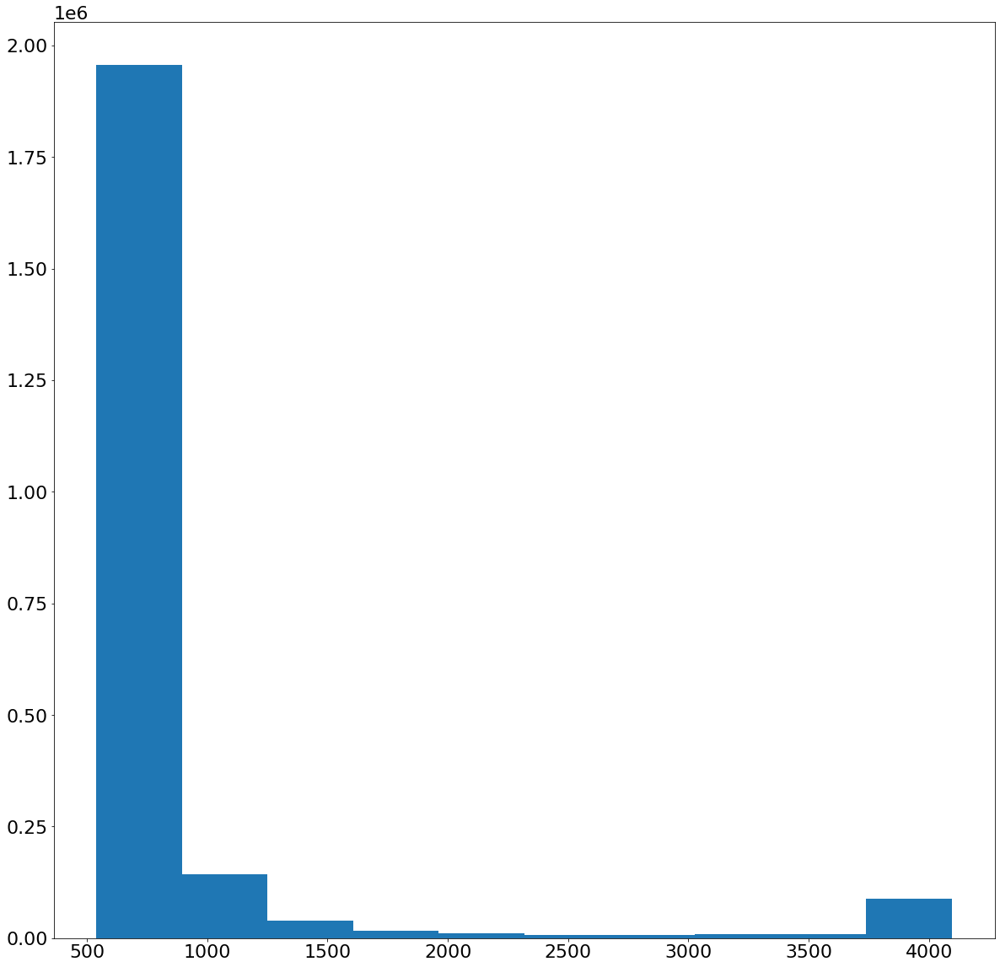

In [92]:
plt.hist(g2.ravel())

In [93]:
DynamicRangeBit = round(np.log2(max(g2.ravel())))
print(DynamicRangeBit)

12


The highest dynamic range calculated in the images is 2^12. 

# 4. Signal Interpolation




In [3]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from google.colab import files
from scipy.interpolate import interp1d
%matplotlib inline
plt.rcParams['figure.figsize'] = [20, 20]
plt.rcParams.update({'font.size': 22})


In [4]:
turt=cv2.imread('/content/drive/MyDrive/Graduate School/OPTI 600C/IMG_75020.png')
#turt = turt[1800:2000,2100:2300]
#fabric=cv2.imread('fabric.png')
#tree=cv2.imread('tree.png')

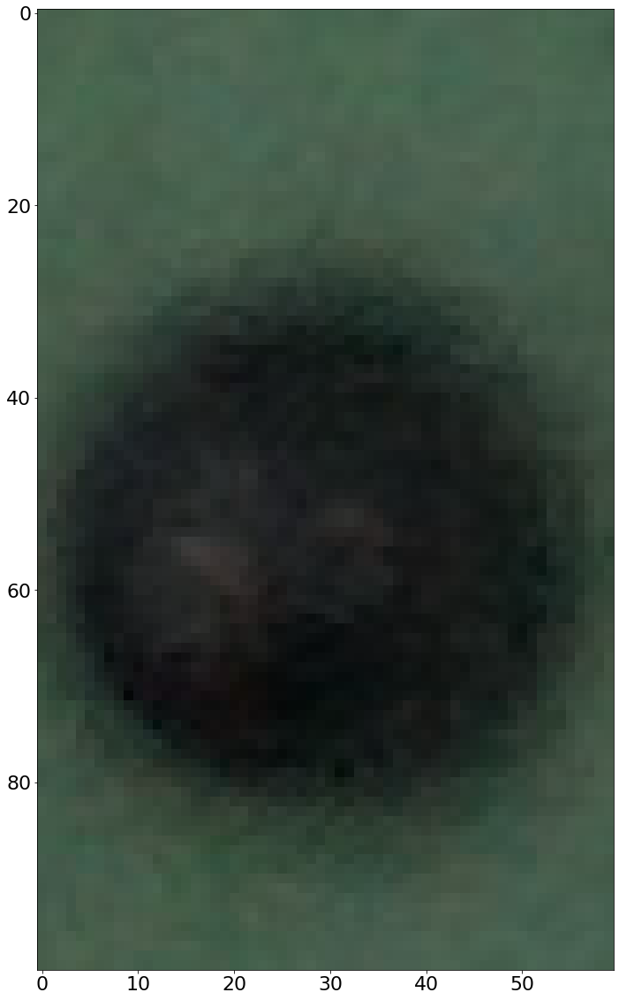

In [19]:
#fabric=fabric[200:600,200:600]
plt.imshow(turt[200:300,140:200])

In [6]:
turt.shape

(396, 603, 3)

## Lanczos interpolation

Lanczos Interpolation

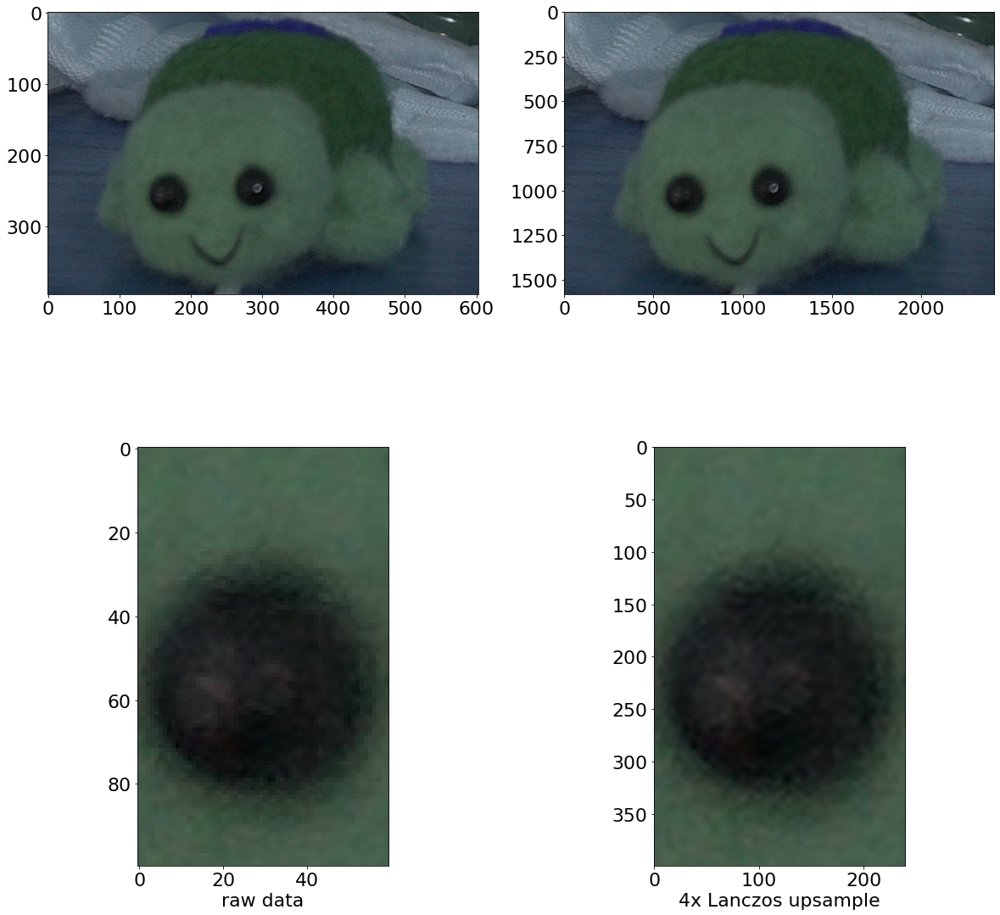

In [23]:
turtLanczos=cv2.resize(turt,(4*603,4*396),interpolation = cv2.INTER_LANCZOS4)
plt.figure(figsize=(20,20))
plt.subplot(2,2,1)
plt.imshow(turt)
plt.subplot(2,2,2)
plt.imshow(turtLanczos)
plt.subplot(2,2,3)
plt.xlabel('raw data')
plt.imshow(turt[200:300,140:200])
plt.subplot(2,2,4)
plt.imshow(turtLanczos[4*200:4*300,4*140:4*200])
plt.xlabel('4x Lanczos upsample')
plt.savefig('treeLanczos.pdf')
#files.download('treeLanczos.pdf')

## Linear Interpolation

Text(0.5, 0, '4x Lanczos upsample')

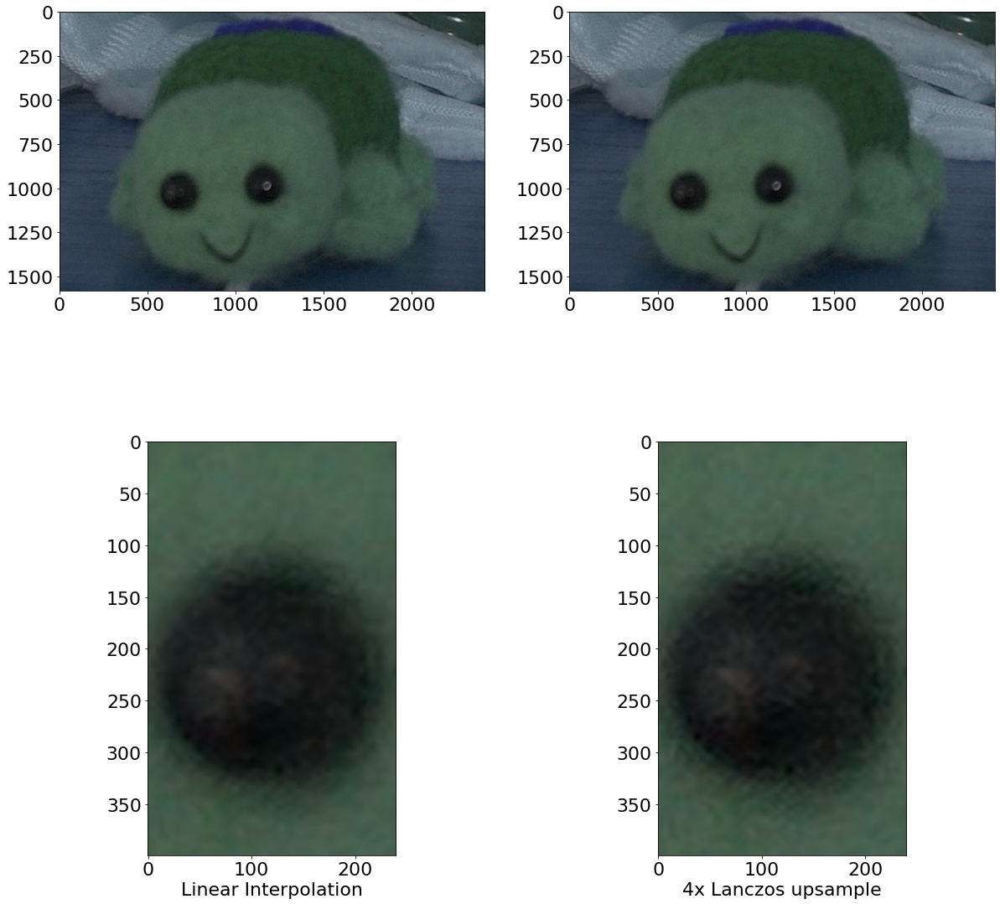

In [29]:
turtLinear=cv2.resize(turt,(4*603,4*396),interpolation = cv2.INTER_LINEAR)
plt.figure(figsize=(20,20))
plt.subplot(2,2,1)
plt.imshow(turtLanczos)
plt.subplot(2,2,2)
plt.imshow(turtLinear)
plt.subplot(2,2,3)
plt.imshow(turtLinear[4*200:4*300,4*140:4*200])
plt.xlabel('Linear Interpolation')
plt.subplot(2,2,4)
plt.imshow(turtLanczos[4*200:4*300,4*140:4*200])
plt.xlabel('4x Lanczos upsample')

## Interpolation and Sharpening

# Image interpolation using artificial neural networks. 

Neural image upsampling using networks described in 

[Enhanced Deep Residual Networks for Single Image Super-Resolution (EDSR)](https://arxiv.org/abs/1707.02921)

[Fast and Accurate Image Super-Resolution with
Deep Laplacian Pyramid Networks (LapSRN)](https://arxiv.org/pdf/1710.01992.pdf) 

is implemented in the openCV class dnn_superres::DnnSuperResImpl

Here we use the approach described in https://learnopencv.com/super-resolution-in-opencv/ 

### Model files

In [30]:
!wget --no-check-certificate --content-disposition 'https://github.com/Saafke/EDSR_Tensorflow/blob/master/models/EDSR_x4.pb?raw=true'
!wget --no-check-certificate --content-disposition 'https://github.com/fannymonori/TF-LapSRN/blob/master/export/LapSRN_x8.pb?raw=true'

--2023-02-16 08:08:20--  https://github.com/Saafke/EDSR_Tensorflow/blob/master/models/EDSR_x4.pb?raw=true
Resolving github.com (github.com)... 20.27.177.113
Connecting to github.com (github.com)|20.27.177.113|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://github.com/Saafke/EDSR_Tensorflow/raw/master/models/EDSR_x4.pb [following]
--2023-02-16 08:08:21--  https://github.com/Saafke/EDSR_Tensorflow/raw/master/models/EDSR_x4.pb
Reusing existing connection to github.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/Saafke/EDSR_Tensorflow/master/models/EDSR_x4.pb [following]
--2023-02-16 08:08:21--  https://raw.githubusercontent.com/Saafke/EDSR_Tensorflow/master/models/EDSR_x4.pb
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.


In [31]:
sr = cv2.dnn_superres.DnnSuperResImpl_create()
modelFile = "EDSR_x4.pb"
sr.readModel(modelFile)
sr.setModel("edsr",4)
turtEDSR= sr.upsample(turt)

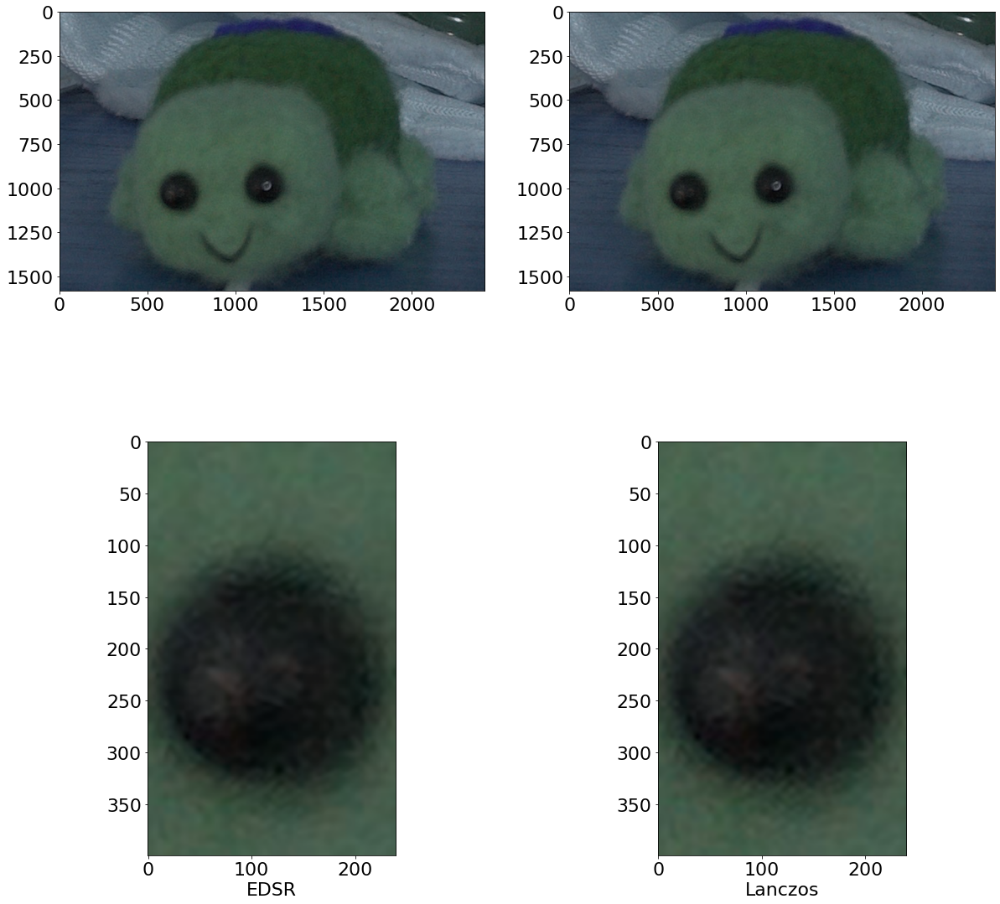

In [32]:
plt.figure(figsize=(20,20))
plt.subplot(2,2,1)
plt.imshow(turtLanczos)
plt.subplot(2,2,2)
plt.imshow(turtEDSR)
plt.subplot(2,2,3)
plt.imshow(turtEDSR[4*200:4*300,4*140:4*200])
plt.xlabel('EDSR')
plt.subplot(2,2,4)
plt.imshow(turtLanczos[4*200:4*300,4*140:4*200])
plt.xlabel('Lanczos')
plt.savefig('treeEDSR.pdf')
#files.download('treeEDSR.pdf')

The EDSR method does a better job interpolating the image as the Lanczos method is more pixelated. This is more noticeable in the transition from black to green as this is mostly where the pixelation is noticable. 

## LapSRN

In [33]:

modelFile = "LapSRN_x8.pb"
sr.readModel(modelFile)
sr.setModel("lapsrn",8)
turtLabSRN= sr.upsample(turt)



In [34]:
turtLanczos=cv2.resize(turt,(8*603,8*396),interpolation = cv2.INTER_LANCZOS4)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

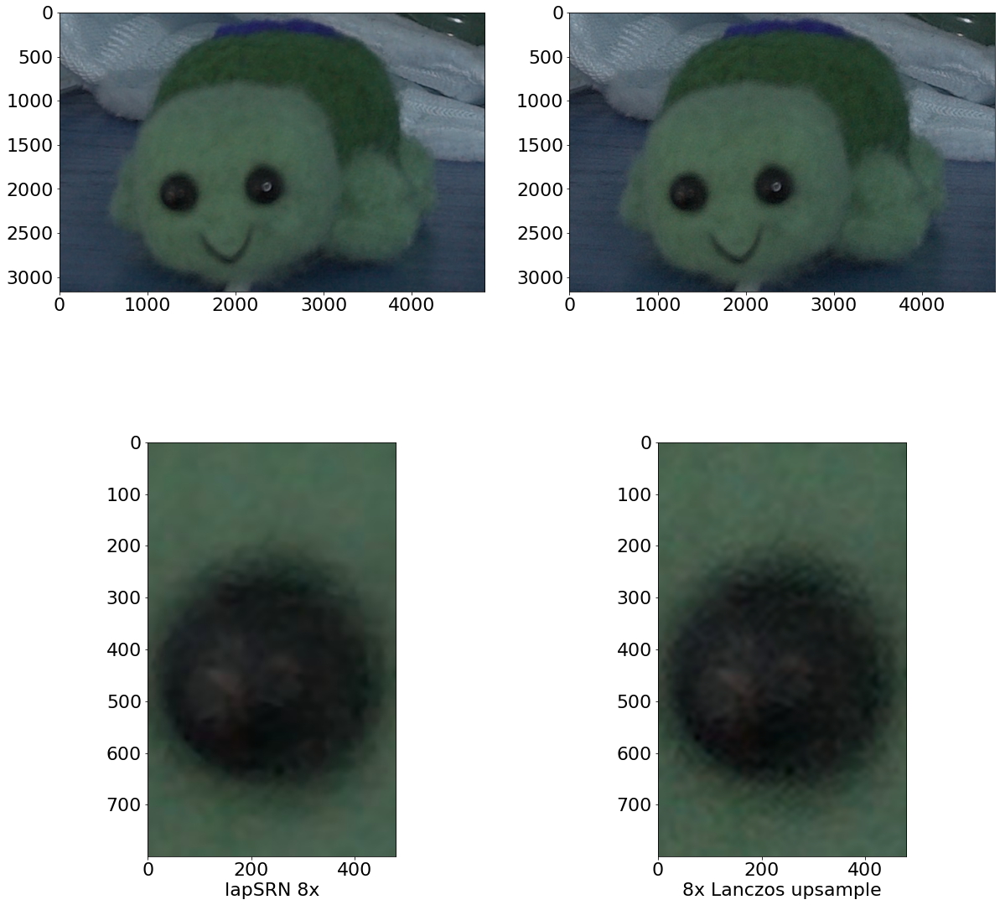

In [35]:

plt.figure(figsize=(20,20))
plt.subplot(2,2,1)
plt.imshow(turtLabSRN)
plt.subplot(2,2,2)
plt.imshow(turtLanczos)
plt.subplot(2,2,3)
plt.xlabel('lapSRN 8x')
plt.imshow(turtLabSRN[8*200:8*300,8*140:8*200])
plt.subplot(2,2,4)
plt.imshow(turtLanczos[8*200:8*300,8*140:8*200])
plt.xlabel('8x Lanczos upsample')
plt.savefig('turtLapSRN.pdf')
#files.download('treeLapSRN.pdf')

The lapSRN 8x does the best job at smoothing the image and making it less pixelated. You can especially see this around the eyes as it is less pixelated and more smooth in its transition across pixels. 